<a href="https://colab.research.google.com/github/rachboyle/mixed_methods_b2b_personas_generation/blob/main/persona_generation_clustering_iterations.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Iterative Mixed Method Approach to B2B SaaS User Personas Overview
This notebook covers the various analysis and clustering steps from our research. An overview of the various steps we took along with links to the corresponding sections are below: 

1.   [**Survey Data Pre-Processing**](https://colab.research.google.com/drive/1qj1C3kptdWUyBuj42WLYLLRDP9U5jK8g#scrollTo=Y32wROVZ0rKt): Survey data cleaning and pre-processing
2.   [**Survey Clustering**](https://colab.research.google.com/drive/1qj1C3kptdWUyBuj42WLYLLRDP9U5jK8g#scrollTo=6ng1v_PwpBHD): Initial survey clustering to produce rudimentary personas we could use for interview recruitment
3.   [**Preprocessing and Clustering Iterations**](https://colab.research.google.com/drive/1qj1C3kptdWUyBuj42WLYLLRDP9U5jK8g#scrollTo=uoEyVTThpDwL): Four iterations of preprocessing and clustering on the web analytics data; the following iterations list clustering algorithm, dimensionality reduction method, and data pre-processing manipulation 
    * [KMeans, PCA, Averaged Data](https://colab.research.google.com/drive/1qj1C3kptdWUyBuj42WLYLLRDP9U5jK8g#scrollTo=BJizI5qMpTRf) 
    * [KMeans, PCA, Percentage Usage Data Per Day](https://colab.research.google.com/drive/1qj1C3kptdWUyBuj42WLYLLRDP9U5jK8g#scrollTo=PpJjj5bqpX6B&line=1&uniqifier=1)
    * [KMeans, UMAP, Percentage Usage Data Per Day](https://colab.research.google.com/drive/1qj1C3kptdWUyBuj42WLYLLRDP9U5jK8g#scrollTo=v5nrJLXkPiaH&line=1&uniqifier=1)
    * [HDBScan, UMAP, Percentage Usage Data Per Week](https://colab.research.google.com/drive/1qj1C3kptdWUyBuj42WLYLLRDP9U5jK8g#scrollTo=cSuZsVxSqcyI)







In [ ]:
#Authenticate to GCP to access survey and web analytics data in BigQuery
from google.colab import auth
auth.authenticate_user()
print('Authenticated')

Authenticated


##Imports

In [ ]:
#Install UMAP (dimensionality reduction) and HDBscan (clustering algorithm)
!pip install umap-learn
!pip install hdbscan

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
from IPython.display import display_html
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm 
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
plt.rcParams.update({'figure.max_open_warning': 0}) #set so you do not get warnings

from sklearn.datasets import fetch_openml
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# Dimension reduction and clustering libraries
import umap.umap_ as umap
import hdbscan
import sklearn.cluster as cluster
from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score
from sklearn.preprocessing import normalize, StandardScaler

#Survey Data Pre-Processing
We administered the survey via qualtrics which has several export as CSV options. The ones we selected and were important in helping to diminsh data manipulation steps, faciliate easier data interpretation, and enable compatibility with downstream actions like clustering were:
1. downloading fields as numerical values rather than choice text, 
2. recoding seen but unanswered questions as -99, 
3. recoding seen but unanswered multi-value fields as 0,
3. remove line breaks,
4. split multi-value fields into columns
5. remove line breaks

The main goals with survey data pre-processing were to identify the questions / responses we wanted to base our clustering on, sanitize out responses that were not significantly completed, and restructure the data into a format suitable for clustering algorithms from existing packages like sklearn.  

From analyzing the data results within the qualtrics app, we determined that task rank and time on task were the data points we wanted to use as features in preliminary clustering. 

Raw Survey Data

In [ ]:
#Showing the original raw survey data 
sheet_id = "17S9byy_6Gtw8IsEvybeHY8OkGDB4jSdcwukQrWtzo08"
sheet_name = "survey_responses"
url = f"https://docs.google.com/spreadsheets/d/{sheet_id}/gviz/tq?tqx=out:csv&sheet={sheet_name}"

raw_survey_df = pd.read_csv(url)

raw_survey_df.head(3)

,Start Date,End Date,Response Type,Progress,Duration (in seconds),Finished,Recorded Date,External Data Reference,Response ID,Location Latitude,Location Longitude,Distribution Channel,User Language,What LiveRamp products do you personally use. (select all that apply) - Connect/Activation,What LiveRamp products do you personally use. (select all that apply) - Connect/Measurement,What LiveRamp products do you personally use. (select all that apply) - Advanced TV,What LiveRamp products do you personally use. (select all that apply) - Safe Haven,What LiveRamp products do you personally use. (select all that apply) - Privacy Manager/ATS,What LiveRamp products do you personally use. (select all that apply) - Data Plus Math,What LiveRamp products do you personally use. (select all that apply) - Data Marketplace,What LiveRamp products do you personally use. (select all that apply) - Onboarding,How long have you been using LiveRamp Products? - Connect/Activation,How long have you been using LiveRamp Products? - Connect/Measurement,How long have you been using LiveRamp Products? - Advanced TV,How long have you been using LiveRamp Products? - Safe Haven,How long have you been using LiveRamp Products? - Privacy Manager/ATS,How long have you been using LiveRamp Products? - Data Plus Math,How long have you been using LiveRamp Products? - Data Marketplace,How long have you been using LiveRamp Products? - Onboarding,"In the last 3 months, how many hours a day did you use LiveRamp products on average? - Connect/Activation","In the last 3 months, how many hours a day did you use LiveRamp products on average? - Connect/Measurement","In the last 3 months, how many hours a day did you use LiveRamp products on average? - Advanced TV","In the last 3 months, how many hours a day did you use LiveRamp products on average? - Safe Haven","In the last 3 months, how many hours a day did you use LiveRamp products on average? - Privacy Manager/ATS","In the last 3 months, how many hours a day did you use LiveRamp products on average? - Data Plus Math","In the last 3 months, how many hours a day did you use LiveRamp products on average? - Data Marketplace","In the last 3 months, how many hours a day did you use LiveRamp products on average? - Onboarding","In general, what is your main goal for using LiveRamp products? (select all that apply) - Selected Choice - Find existing and new customers for my products and advertise to them","In general, what is your main goal for using LiveRamp products? (select all that apply) - Selected Choice - Monetize my data","In general, what is your main goal for using LiveRamp products? (select all that apply) - Selected Choice - Link or map our identity to LiveRamp identity to make my offering more compelling",...,Which of the following statements best describes your experience with LiveRamp products?,What LiveRamp features or capabilities are most important to you?,What capabilities do you wish LiveRamp products had?,How likely are you to recommend our products to a friend or colleague ?,Which of these other companies did you consider or try before starting to use LiveRamp?(select all that apply) - Selected Choice - InfoSum,Which of these other companies did you consider or try before starting to use LiveRamp?(select all that apply) - Selected Choice - Neustar,Which of these other companies did you consider or try before starting to use LiveRamp?(select all that apply) - Selected Choice - The Trade Desk,Which of these other companies did you consider or try before starting to use LiveRamp?(select all that apply) - Selected Choice - Snowflake,Which of these other companies did you consider or try before starting to use LiveRamp?(select all that apply) - Selected Choice - Epsilon and Conversant,"Which of these other companies did you consider or try before starting to use LiveRamp?(select all that apply) - Selected Choice - TransUnion (Signal, Tru Optik)",Which of these other companies did you consider or try before starting to 

In [ ]:
#Showing the total number of columns and examples of the questions
raw_survey_df.columns

Index(['Start Date', 'End Date', 'Response Type', 'Progress',
       'Duration (in seconds)', 'Finished', 'Recorded Date',
       'External Data Reference', 'Response ID', 'Location Latitude',
       ...
       'Do you use any accessibility features, such as the following? - Other (please specify) - Text',
       'Thinking about everything that you use LiveRamp for and your reasons for choosing LiveRamp, what three words would you use to describe how using LiveRamp makes you feel? - Word 1',
       'Thinking about everything that you use LiveRamp for and your reasons for choosing LiveRamp, what three words would you use to describe how using LiveRamp makes you feel? - Word 2',
       'Thinking about everything that you use LiveRamp for and your reasons for choosing LiveRamp, what three words would you use to describe how using LiveRamp makes you feel? - Word 3',
       'Company name',
       'As a thank-you for taking part, you will be entered into a prize draw to win one of three priz

Manipulated Survey Data: 
* reformatted column names for easier interpretability, especially for multi select questions, 
* mapped row values for easier downstream computation 
    * i.e. For the question "How long do you spend on task XYZ?" responses are NUMBERS representing different choices such as 1 - 5 mins, 2 - 10 mins, 3 - 15 mins, etc. Converted all responses to true numerical values 1 --> 5, 2 --> 10, 3 --> 15, etc.   
* selected only questions, and therefore columns, of interest
* sanitized survey responses that were uncompleted

In [ ]:
%%bigquery --project uxr-design-us-dev task_rank_df
SELECT -- ReceipientEmail is not included for anonymity
-- grab the columns on users ranking the priority of identified tasks in our platform
task_rank_build_audience, task_rank_usage_reports, task_rank_lsh_lookalike, task_rank_add_users, task_rank_set_permissions, 
task_rank_data_ingestion, task_rank_dm_upload, task_rank_manage_data, task_rank_manage_das, task_rank_distribute, task_rank_understand_reach, 
task_rank_request_dm_segments, task_rank_sql_queries, task_rank_data_vis, task_rank_use_ats, task_rank_help_docs, task_rank_support_tix, 
-- grab the columns on users self-attesting to time spent on identified tasks per day
task_time_per_day_build_audience, task_time_per_day_usage_reports, task_time_per_day_lsh_lookalike, task_time_per_day_add_users, task_time_per_day_set_permissions, 
task_time_per_day_data_ingestion,task_time_per_day_dm_upload, task_time_per_day_manage_data, task_time_per_day_manage_das, task_time_per_day_distribute,task_time_per_day_understand_reach, 
task_time_per_day_request_dm_segments, task_time_per_day_sql_queries, task_time_per_day_data_vis, task_time_per_day_use_ats, task_time_per_day_help_docs, task_time_per_day_support_tix, 
FROM `uxr-design-us-dev.persona_study_2021.raw_survey_data_multiselect_numerical_columns_07272021`

In [ ]:
#Grab column names to use a features in clustering
features = task_rank_df.columns.tolist()
rank = features[0:len(features)//2] #first half of columns relate to rank
time = features[len(features)//2::] #second half of columns relate to time

assert (len(rank) == len(time))
assert len(features) == len(rank) + len(time) 

In [ ]:
#Function that checks to see if all the values in a row of a df are ints
def is_all_ints(row):
  int_count = 0
  str_count = 0
  # int_values = []
  # str_values = []
  for value in row:
    if type(value) == int:
      # if value not in int_values:
      #   int_values.append(value)
      int_count += 1
    elif type(value) == str:
      # if value not in str_values:
      #   str_values.append(value)
      str_count += 1
  if int_count == 0 & str_count == 0:
      # print("No ints or strs, but: " + str(type(value)))
      return False
  else:
    # print("int:" + str(int_count) + "\nint value:" + str(int_value) + "\nstr:" + str(str_count))
    return len(row) == int_count
    
#Manipulate Survey Data into Best Form for Clustering
def manipulate_df(df):
  #Fill Nulls with 0s and change data type to int
  df = df.fillna(0)

  #Cast numbers as int in order to perform the replacing functions below
  df = df.astype(int)

  #Santize data of entries user made no selection
  df["rank_nulls"] = (df[rank] == 0).sum(axis = 1)
  df["time_nulls"] = (df[time] == 0).sum(axis = 1)
  filled_df = df[(df.time_nulls != len(time)) & (df.rank_nulls != len(rank))].copy()
  filled_df.drop(["rank_nulls", "time_nulls"], axis=1) #Added to remove an unnecessary column

  #Grab the counts of numerical response before converting to minutes
  pre_cnt_0 = (filled_df.task_time_per_day_build_audience == 0).sum(axis=0)
  pre_cnt_1 = (filled_df.task_time_per_day_build_audience == 1).sum(axis=0)
  pre_cnt_2 = (filled_df.task_time_per_day_build_audience == 2).sum(axis=0)
  pre_cnt_3 = (filled_df.task_time_per_day_build_audience == 3).sum(axis=0)
  pre_cnt_4 = (filled_df.task_time_per_day_build_audience == 4).sum(axis=0)
  pre_cnt_5 = (filled_df.task_time_per_day_build_audience == 5).sum(axis=0)
  pre_cnt_6 = (filled_df.task_time_per_day_build_audience == 6).sum(axis=0)
  pre_cnt_7 = (filled_df.task_time_per_day_build_audience == 7).sum(axis=0)
  pre_total_cnt = filled_df.task_time_per_day_build_audience.count()

  #Manipuate column and change from categorical data to numerical values of time (mins) on task
  for col in time: 
    filled_df[col].replace(1, 5.5, inplace=True)
    filled_df[col].replace(2, 15, inplace=True)
    filled_df[col].replace(3, 25, inplace=True)
    filled_df[col].replace(4, 35, inplace=True)
    filled_df[col].replace(5, 45, inplace=True)
    filled_df[col].replace(6, 55, inplace=True)
    filled_df[col].replace(7, 65, inplace=True)

  #Grab the counts of numerical response after converting to minutes
  post_cnt_0 = (filled_df.task_time_per_day_build_audience == 0).sum(axis=0)
  post_cnt_1 = (filled_df.task_time_per_day_build_audience == 5.5).sum(axis=0)
  post_cnt_2 = (filled_df.task_time_per_day_build_audience == 15).sum(axis=0)
  post_cnt_3 = (filled_df.task_time_per_day_build_audience == 25).sum(axis=0)
  post_cnt_4 = (filled_df.task_time_per_day_build_audience == 35).sum(axis=0)
  post_cnt_5 = (filled_df.task_time_per_day_build_audience == 45).sum(axis=0)
  post_cnt_6 = (filled_df.task_time_per_day_build_audience == 55).sum(axis=0)
  post_cnt_7 = (filled_df.task_time_per_day_build_audience == 65).sum(axis=0)
  post_total_cnt = filled_df.task_time_per_day_build_audience.count()

  #Check the counts are equivalent before and after conversion
  assert pre_cnt_0 == post_cnt_0
  assert pre_cnt_1 == post_cnt_1
  assert pre_cnt_2 == post_cnt_2
  assert pre_cnt_3 == post_cnt_3
  assert pre_cnt_4 == post_cnt_4
  assert pre_cnt_5 == post_cnt_5
  assert pre_cnt_6 == post_cnt_6
  assert pre_cnt_7 == post_cnt_7
  assert pre_total_cnt == post_total_cnt

  for r in rank:
    assert is_all_ints(filled_df[r]) is True 

  #Replace zero values with max rank for all rank task columns to keep directionality of rank (1- highest rank, 24- lowest rank)
  for col in rank: 
    filled_df[col].replace(0, len(rank), inplace=True)

  return filled_df

In [ ]:
#Showing the manipulated survey data
survey_df = manipulate_df(task_rank_df)
survey_df.head()

,task_rank_build_audience,task_rank_usage_reports,task_rank_lsh_lookalike,task_rank_add_users,task_rank_set_permissions,task_rank_data_ingestion,task_rank_dm_upload,task_rank_manage_data,task_rank_manage_das,task_rank_distribute,task_rank_understand_reach,task_rank_request_dm_segments,task_rank_sql_queries,task_rank_data_vis,task_rank_use_ats,task_rank_help_docs,task_rank_support_tix,task_time_per_day_build_audience,task_time_per_day_usage_reports,task_time_per_day_lsh_lookalike,task_time_per_day_add_users,task_time_per_day_set_permissions,task_time_per_day_data_ingestion,task_time_per_day_dm_upload,task_time_per_day_manage_data,task_time_per_day_manage_das,task_time_per_day_distribute,task_time_per_day_understand_reach,task_time_per_day_request_dm_segments,task_time_per_day_sql_queries,task_time_per_day_data_vis,task_time_per_day_use_ats,task_time_per_day_help_docs,task_time_per_day_support_tix,rank_nulls,time_nulls
69,7,5,17,9,17,6,17,3,4,2,1,17,17,17,17,8,17,5.5,5.5,0.0,5.5,0.0,5.5,0.0,5.5,5.5,5.5,5.5,0.0,0.0,0.0,0.0,5.5,0.0,8,8
72,17,17,17,17,17,1,17,17,17,17,17,17,17,17,17,17,17,0.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16,16
75,2,17,17,17,17,1,17,3,17,17,17,17,17,17,17,17,17,5.5,0.0,0.0,0.0,0.0,5.5,0.0,5.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14,14
81,3,17,17,17,17,1,17,17,17,2,17,17,17,17,17,17,17,55.0,0.0,0.0,0.0,0.0,55.0,0.0,0.0,0.0,55.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14,14
83,3,17,17,17,17,4,17,17,17,1,2,17,17,17,17,17,17,25.0,0.0,0.0,0.0,0.0,25.0,0.0,0.0,0.0,25.0,25.0,0.0,0.0,0.0,0.0,0.0,0.0,13,13


#Survey Data Clustering

In [ ]:
#import modules for clustering and plotting
import pandas as pd
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm 
from sklearn.preprocessing import normalize, StandardScaler
from sklearn.decomposition import PCA
plt.rcParams.update({'figure.max_open_warning': 0}) #set so you do not get warnings

In [ ]:
#Make a copy of the data to perform the transformations and normalization on
X = survey_df[rank].copy()

#Use the standard scaler algorithm to normalize the data
scaler = StandardScaler()
X[rank] = scaler.fit_transform(X[rank])

,task_rank_build_audience,task_rank_usage_reports,task_rank_lsh_lookalike,task_rank_add_users,task_rank_set_permissions,task_rank_data_ingestion,task_rank_dm_upload,task_rank_manage_data,task_rank_manage_das,task_rank_distribute,task_rank_understand_reach,task_rank_request_dm_segments,task_rank_sql_queries,task_rank_data_vis,task_rank_use_ats,task_rank_help_docs,task_rank_support_tix
69,0.323730,-1.495895,0.228457,-0.575760,0.440196,-0.254494,0.679458,-1.524542,-0.845098,-0.588322,-2.342034,0.550920,0.258902,0.251660,0.241045,-1.083487,0.774615
72,2.017893,0.635394,0.228457,0.774659,0.440196,-0.945645,0.679458,0.787232,1.143996,1.875754,0.600120,0.550920,0.258902,0.251660,0.241045,0.716124,0.774615
75,-0.523352,0.635394,0.228457,0.774659,0.440196,-0.945645,0.679458,-1.524542,1.143996,1.875754,0.600120,0.550920,0.258902,0.251660,0.241045,0.716124,0.774615
81,-0.353936,0.635394,0.228457,0.774659,0.440196,-0.945645,0.679458,0.787232,1.143996,-0.588322,0.600120,0.550920,0.258902,0.251660,0.241045,0.716124,0.774615
83,-0.353936,0.635394,0.228457,0.774659,0.440196,-0.530954,0.679458,0.787232,1.143996,-0.752594,-2.158150,0.550920,0.258902,0.251660,0.241045,0.716124,0.774615
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
474,-0.184519,-0.785465,0.228457,-1.082168,-1.612284,-0.392724,-1.009368,-1.524542,-1.151113,-0.752594,-0.687073,0.054515,-1.745002,-1.341674,0.241045,0.316211,-0.173443
475,-0.523352,-0.963073,0.228457,-0.406958,-0.472017,-0.945645,-1.178251,-1.194288,-0.080062,-0.424050,-1.790380,-1.103765,0.258902,0.251660,0.241045,-0.483616,-0.173443
476,-0.692769,0.635394,0.228457,-1.588575,-2.524497,1.266039,-1.009368,-0.698908,-0.080062,0.725852,-0.503188,-1.931107,0.258902,0.251660,0.241045,-0.083703,-0.173443
477,-0.692769,-1.140680,0.228457,-0.238155,-1.156177,-0.392724,0.679458,-1.029162,-0.233069,-0.424050,-1.790380,0.550920,-4.750858,-2.935009,0.241045,0.716124,0.205780


In [ ]:
#Function that helps find the optimal number of clusters by using the Elbow Method
def plot_elbow_curve(df, title):
  wcss = []
  for k in range(1,20):
      kmeans = KMeans(n_clusters=k, init="k-means++")
      kmeans.fit(df.iloc[:,1:])
      wcss.append(kmeans.inertia_)
  plt.figure(figsize=(12,6))    
  plt.plot(range(1,20),wcss, linewidth=2, color="red", marker ="8")
  plt.grid(True)
  plt.xlabel("K Value")
  plt.xticks(np.arange(1,20,1))
  plt.ylabel("WCSS")
  plt.title(title)
  plt.show()

#Perform K Means clustering and find averages for each cluster
def kmeans_clustering_aves(num, df, cluster_name, features=features):
  kmeans = KMeans(n_clusters=num, init='k-means++', n_init=20)
  y = kmeans.fit_predict(df[features])
  df[cluster_name] = y
  kmeans_summary = df.groupby([cluster_name]).mean()
  kmeans_summary['count'] = df[cluster_name].value_counts()
  kmeans_summary = kmeans_summary.sort_values(by='count', ascending=False)
  # print(kmeans_summary)
  return kmeans_summary

#Plot the averages for each cluster and rank the tasks
def cluster_means_and_plots(kmeans_summary):
  #plot each cluster and calculate averages
  cnt = kmeans_summary['count'].sum() #total number of individuals to understand % of survey respondents in each cluster
  unique_top_tasks = {}
  for cluster_num, row in kmeans_summary.iterrows():
    print("\n")
    print("PERSONA CLUSTER:", cluster_num, "\n")
    print("NUMBER OF PARTICIPANTS IN CLUSTER:", row["count"], "\n")
    print("PERCENTAGE OF PARTICIPANTS IN CLUSTER:", round(100*row["count"]/cnt, 3), "\n") #originall the dividend is 266, changed to be the total
    cluster_df = pd.DataFrame(index = tasks)
    cluster_df.insert(0,"rank", row[rank].values)
    cluster_df.insert(1,"time", row[time].values)
    plt.scatter(cluster_df["rank"], cluster_df["time"], c=colormap) #color for each task
    plt.grid(True)
    plt.xlabel("Rank")
    plt.ylabel("Time")
    plt.show() 

    cluster_df = cluster_df.sort_values(by=["rank"], ascending=True)
    print(cluster_df)

    #keep track of top tasks
    top_tasks = list(cluster_df.head(5).index)
    for top_task in top_tasks:
      if top_task not in unique_top_tasks.keys():
        unique_top_tasks[top_task] = 1
      else:
        unique_top_tasks[top_task] += 1 

  return unique_top_tasks

Dimensionality Reduction via PCA

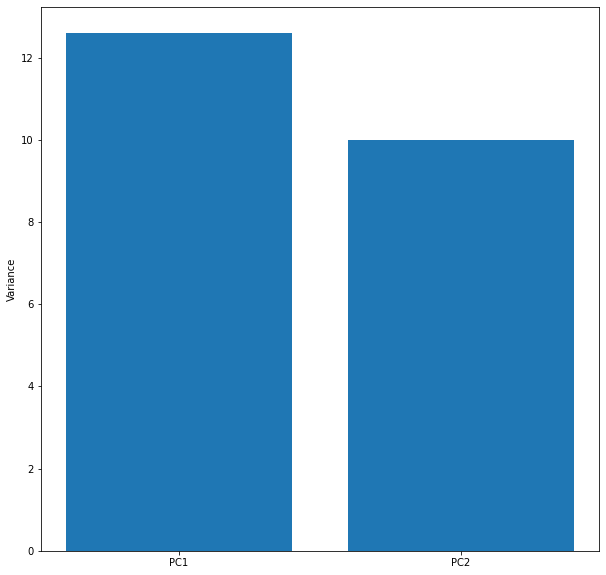

In [ ]:
pca = PCA(n_components=2)
data = pca.fit_transform(X)

plt.figure(figsize=(10,10))
var = np.round(pca.explained_variance_ratio_*100, decimals = 1)
lbls = ['PC'+ str(x) for x in range(1,len(var)+1)]
plt.bar(x=range(1,len(var)+1), height = var, tick_label = lbls)
plt.ylabel('Variance')
plt.show()

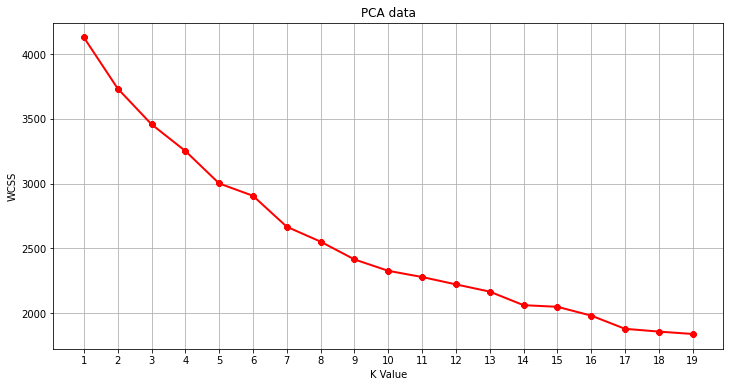

In [ ]:
#Plot the elbow curve to find best value for K means
plot_elbow_curve(X[rank], "PCA data")

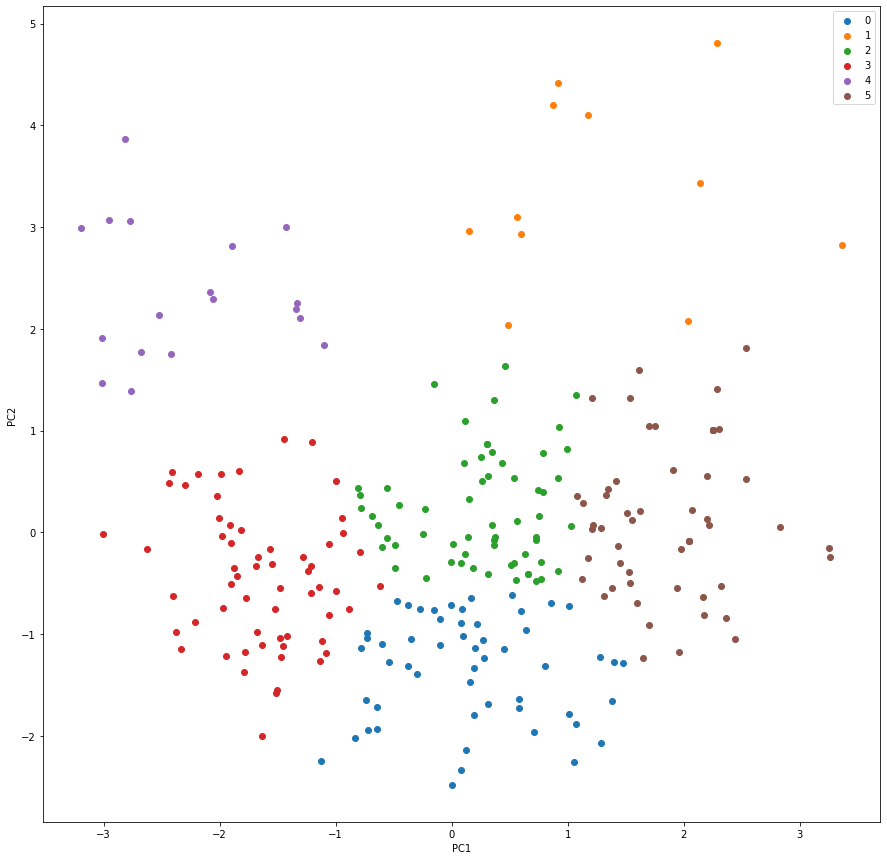

In [ ]:
survey_model = KMeans(n_clusters = 6, init = "k-means++", n_init=20)
survey_label = survey_model.fit_predict(data)

plt.figure(figsize=(15,15))
uniq = np.unique(survey_label)
for i in uniq:
  plt.scatter(data[survey_label == i , 0] , data[survey_label == i , 1] , label = i)
plt.xlabel([])
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()
plt.show()

In [ ]:
cluster_name = "kmeans_pca_cluster"
survey_df[cluster_name] = survey_label
kmeans_summary = survey_df.groupby([cluster_name]).mean()
kmeans_summary['count'] = survey_df[cluster_name].value_counts()
kmeans_summary = kmeans_summary.sort_values(by='count', ascending=False)
kmeans_summary

,task_rank_build_audience,task_rank_usage_reports,task_rank_lsh_lookalike,task_rank_add_users,task_rank_set_permissions,task_rank_data_ingestion,task_rank_dm_upload,task_rank_manage_data,task_rank_manage_das,task_rank_distribute,task_rank_understand_reach,task_rank_request_dm_segments,task_rank_sql_queries,task_rank_data_vis,task_rank_use_ats,task_rank_help_docs,task_rank_support_tix,task_time_per_day_build_audience,task_time_per_day_usage_reports,task_time_per_day_lsh_lookalike,task_time_per_day_add_users,task_time_per_day_set_permissions,task_time_per_day_data_ingestion,task_time_per_day_dm_upload,task_time_per_day_manage_data,task_time_per_day_manage_das,task_time_per_day_distribute,task_time_per_day_understand_reach,task_time_per_day_request_dm_segments,task_time_per_day_sql_queries,task_time_per_day_data_vis,task_time_per_day_use_ats,task_time_per_day_help_docs,task_time_per_day_support_tix,rank_nulls,time_nulls,count
kmeans_pca_cluster,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2,4.245902,14.213115,16.754098,11.000000,14.754098,6.721311,13.786885,10.950820,10.442623,7.032787,14.918033,16.131148,17.000000,17.000000,16.540984,14.000000,14.721311,16.877049,4.221311,0.245902,6.344262,1.942623,13.721311,4.221311,8.598361,6.516393,13.336066,3.139344,1.975410,0.000000,0.000000,0.180328,4.557377,3.000000,11.983607,11.983607,61
3,6.433333,11.316667,17.000000,10.750000,14.250000,4.016667,10.566667,8.916667,4.633333,2.683333,10.716667,15.983333,16.683333,16.800000,16.100000,10.616667,8.833333,13.233333,7.625000,0.000000,7.141667,4.333333,16.275000,10.900000,14.716667,17.933333,20.958333,8.966667,1.266667,0.666667,0.508333,1.341667,11.841667,13.875000,8.383333,8.383333,60
0,7.111111,13.425926,17.000000,12.203704,16.592593,11.685185,12.722222,16.388889,7.611111,2.407407,13.759259,8.296296,17.000000,17.000000,15.314815,12.962963,11.166667,14.481481,5.453704,0.000000,3.379630,0.564815,5.453704,5.435185,0.481481,10.796296,21.546296,4.509259,12.435185,0.000000,0.000000,2.324074,5.851852,8.564815,11.259259,11.259259,54
5,2.685185,15.425926,16.740741,15.962963,17.000000,10.185185,14.740741,14.962963,15.703704,9.129630,16.703704,12.074074,17.000000,16.777778,16.722222,15.981481,16.740741,19.370370,2.990741,0.277778,2.231481,0.000000,7.870370,2.712963,1.527778,2.509259,9.907407,0.101852,6.175926,0.000000,0.462963,0.101852,1.138889,0.101852,14.000000,14.000000,54
4,4.777778,10.944444,15.833333,11.111111,9.277778,5.222222,12.722222,7.111111,6.111111,3.888889,10.500000,16.500000,9.388889,10.722222,16.833333,12.277778,12.722222,31.472222,9.388889,1.138889,6.305556,7.944444,21.222222,7.027778,25.111111,20.111111,26.444444,20.305556,1.694444,30.611111,28.361111,0.305556,10.777778,9.138889,6.777778,6.777778,18
1,4.818182,14.727273,5.636364,15.000000,13.818182,8.818182,14.636364,12.000000,15.727273,14.272727,14.272727,17.000000,13.000000,14.636364,17.000000,17.000000,15.272727,11.636364,1.863636,14.272727,1.000000,3.227273,15.545455,4.545455,10.045455,0.500000,6.409091,2.772727,0.000000,9.590909,3.636364,0.000000,0.000000,1.000000,12.545455,12.545455,11


In [ ]:
#Splice the columns to just be the task names for plotting purposes
tasks = []
prefix = "task_rank_"
for item in rank:
  tasks.append(item[len(prefix)::])

colormap= cm.rainbow(np.linspace(0, 1, len(tasks)))



PERSONA CLUSTER: 2 

NUMBER OF PARTICIPANTS IN CLUSTER: 61.0 

PERCENTAGE OF PARTICIPANTS IN CLUSTER: 23.643 



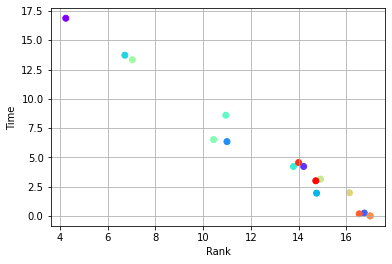

                          rank       time
build_audience        4.245902  16.877049
data_ingestion        6.721311  13.721311
distribute            7.032787  13.336066
manage_das           10.442623   6.516393
manage_data          10.950820   8.598361
add_users            11.000000   6.344262
dm_upload            13.786885   4.221311
help_docs            14.000000   4.557377
usage_reports        14.213115   4.221311
support_tix          14.721311   3.000000
set_permissions      14.754098   1.942623
understand_reach     14.918033   3.139344
request_dm_segments  16.131148   1.975410
use_ats              16.540984   0.180328
lsh_lookalike        16.754098   0.245902
sql_queries          17.000000   0.000000
data_vis             17.000000   0.000000


PERSONA CLUSTER: 3 

NUMBER OF PARTICIPANTS IN CLUSTER: 60.0 

PERCENTAGE OF PARTICIPANTS IN CLUSTER: 23.256 



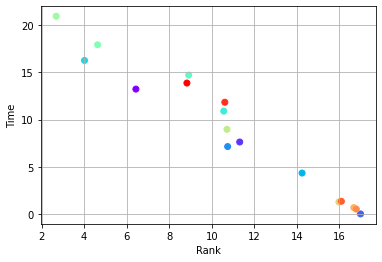

                          rank       time
distribute            2.683333  20.958333
data_ingestion        4.016667  16.275000
manage_das            4.633333  17.933333
build_audience        6.433333  13.233333
support_tix           8.833333  13.875000
manage_data           8.916667  14.716667
dm_upload            10.566667  10.900000
help_docs            10.616667  11.841667
understand_reach     10.716667   8.966667
add_users            10.750000   7.141667
usage_reports        11.316667   7.625000
set_permissions      14.250000   4.333333
request_dm_segments  15.983333   1.266667
use_ats              16.100000   1.341667
sql_queries          16.683333   0.666667
data_vis             16.800000   0.508333
lsh_lookalike        17.000000   0.000000


PERSONA CLUSTER: 0 

NUMBER OF PARTICIPANTS IN CLUSTER: 54.0 

PERCENTAGE OF PARTICIPANTS IN CLUSTER: 20.93 



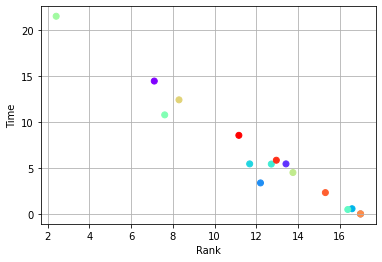

                          rank       time
distribute            2.407407  21.546296
build_audience        7.111111  14.481481
manage_das            7.611111  10.796296
request_dm_segments   8.296296  12.435185
support_tix          11.166667   8.564815
data_ingestion       11.685185   5.453704
add_users            12.203704   3.379630
dm_upload            12.722222   5.435185
help_docs            12.962963   5.851852
usage_reports        13.425926   5.453704
understand_reach     13.759259   4.509259
use_ats              15.314815   2.324074
manage_data          16.388889   0.481481
set_permissions      16.592593   0.564815
sql_queries          17.000000   0.000000
data_vis             17.000000   0.000000
lsh_lookalike        17.000000   0.000000


PERSONA CLUSTER: 5 

NUMBER OF PARTICIPANTS IN CLUSTER: 54.0 

PERCENTAGE OF PARTICIPANTS IN CLUSTER: 20.93 



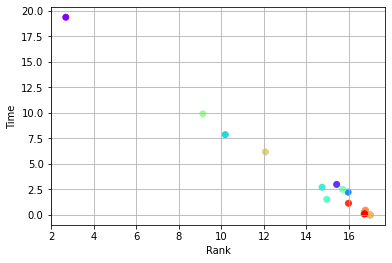

                          rank       time
build_audience        2.685185  19.370370
distribute            9.129630   9.907407
data_ingestion       10.185185   7.870370
request_dm_segments  12.074074   6.175926
dm_upload            14.740741   2.712963
manage_data          14.962963   1.527778
usage_reports        15.425926   2.990741
manage_das           15.703704   2.509259
add_users            15.962963   2.231481
help_docs            15.981481   1.138889
understand_reach     16.703704   0.101852
use_ats              16.722222   0.101852
lsh_lookalike        16.740741   0.277778
support_tix          16.740741   0.101852
data_vis             16.777778   0.462963
sql_queries          17.000000   0.000000
set_permissions      17.000000   0.000000


PERSONA CLUSTER: 4 

NUMBER OF PARTICIPANTS IN CLUSTER: 18.0 

PERCENTAGE OF PARTICIPANTS IN CLUSTER: 6.977 



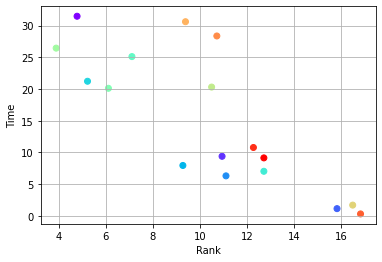

                          rank       time
distribute            3.888889  26.444444
build_audience        4.777778  31.472222
data_ingestion        5.222222  21.222222
manage_das            6.111111  20.111111
manage_data           7.111111  25.111111
set_permissions       9.277778   7.944444
sql_queries           9.388889  30.611111
understand_reach     10.500000  20.305556
data_vis             10.722222  28.361111
usage_reports        10.944444   9.388889
add_users            11.111111   6.305556
help_docs            12.277778  10.777778
dm_upload            12.722222   7.027778
support_tix          12.722222   9.138889
lsh_lookalike        15.833333   1.138889
request_dm_segments  16.500000   1.694444
use_ats              16.833333   0.305556


PERSONA CLUSTER: 1 

NUMBER OF PARTICIPANTS IN CLUSTER: 11.0 

PERCENTAGE OF PARTICIPANTS IN CLUSTER: 4.264 



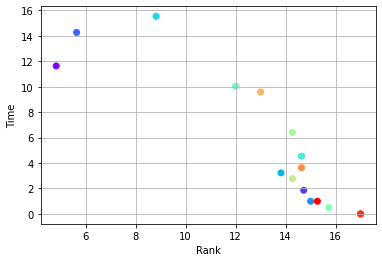

                          rank       time
build_audience        4.818182  11.636364
lsh_lookalike         5.636364  14.272727
data_ingestion        8.818182  15.545455
manage_data          12.000000  10.045455
sql_queries          13.000000   9.590909
set_permissions      13.818182   3.227273
distribute           14.272727   6.409091
understand_reach     14.272727   2.772727
dm_upload            14.636364   4.545455
data_vis             14.636364   3.636364
usage_reports        14.727273   1.863636
add_users            15.000000   1.000000
support_tix          15.272727   1.000000
manage_das           15.727273   0.500000
help_docs            17.000000   0.000000
use_ats              17.000000   0.000000
request_dm_segments  17.000000   0.000000


In [ ]:
top_tasks = cluster_means_and_plots(kmeans_summary)

In [ ]:
#Show the top unique tasks across all clusters
top_tasks

{'build_audience': 6,
 'data_ingestion': 5,
 'distribute': 5,
 'dm_upload': 1,
 'lsh_lookalike': 1,
 'manage_das': 4,
 'manage_data': 3,
 'request_dm_segments': 2,
 'sql_queries': 1,
 'support_tix': 2}

#Web Analytics Pre-Processing and Sanitization
We processed the data in three ways: 
1. **Averages of the raw data**: on a per day average, user A spends __# clicks on feature X, __ mins on page X)
2. **Average percentages per day data**: on a per day average, __% of user A's total clicks are spent on feature X, __% of user A's total time is spent on page X)  
3. **Average percentages per week data**: on a per week average, __% of user A's total clicks are spent on feature X, __% of user A's total time is spent on page X)

Below is an example of how this was done for the last pre-processing method, *average percentages per week data*. The queries listed below are the original ones used and hence reference an email column. This is illustratory, showing how we handled visitor_id <> email pairings and duplicates. However, in the actual clustering iterations email will be removed in queries and outputs for anonymity. 

##Data Aggregation
Aggregate the data by week by assigning each row a year-week id that can then be used to sum event and time data by week per user. Handle duplicate visitors (with the same email).

In [ ]:
#Counts to check against when de-duping the email <> visitor_ids 
%%bigquery --project uxr-design-us-dev duplicates
SELECT "auth visitors w/ duplicate emails" as type, SUM(cnt) as num
FROM (
    SELECT distinct email, COUNT(distinct visitor_id) as cnt 
    FROM `uxr-design-us-dev.clustering_datasets.all_features_telemetry_data`
    WHERE email is not NULL
    GROUP BY email
    ORDER BY cnt DESC
)
WHERE cnt > 1

UNION ALL

SELECT "auth visitors with 1 id" as type, count(email) as num
FROM (
    SELECT distinct email, COUNT(distinct visitor_id) as cnt 
    FROM `uxr-design-us-dev.clustering_datasets.all_features_telemetry_data`
    WHERE email is not NULL
    GROUP BY email
    ORDER BY cnt DESC
)
WHERE cnt = 1

UNION ALL

SELECT "authenticated visitors" as type, count(distinct visitor_id) as num
FROM `uxr-design-us-dev.clustering_datasets.all_features_telemetry_data`
WHERE email is not NULL

UNION ALL

SELECT "anonymous visitors" as type, count(distinct visitor_id) as num
FROM `uxr-design-us-dev.clustering_datasets.all_features_telemetry_data`
WHERE email is NULL

UNION ALL

SELECT "total visitors counting distinct ids" as type, count(*) as num
FROM (
    SELECT distinct visitor_id
    FROM `uxr-design-us-dev.clustering_datasets.all_features_telemetry_data`
)

UNION ALL

SELECT "total visitors counting distinct email <> id" as type, count(*) as num
FROM (
    SELECT distinct email, visitor_id
    FROM `uxr-design-us-dev.clustering_datasets.all_features_telemetry_data`
)

UNION ALL

SELECT "visitor ids with multiple emails" as type, count(visitor_id) as num
FROM (
    SELECT distinct visitor_id, count(distinct email) as cnt
    FROM `uxr-design-us-dev.clustering_datasets.all_features_telemetry_data`
    GROUP BY visitor_id
)
WHERE cnt > 1

In [ ]:
#After investigation, weird edge cases are due to internal testing accounts (i.e. visitor id wth multiple emails)
duplicates

,type,num
0,anonymous visitors,11085
1,total visitors counting distinct ids,34875
2,visitor ids with multiple emails,1
3,authenticated visitors,23790
4,auth visitors w/ duplicate emails,809
5,auth visitors with 1 id,22982
6,total visitors counting distinct email <> id,34876


In [ ]:
#Convert Telemetry Data to be Per Week rather than Per Day, consolidate ids
%%bigquery --project uxr-design-us-dev features_df
with dup_week AS (
  SELECT *, CONCAT(EXTRACT(YEAR from day), "-", EXTRACT(WEEK from day)) as week_num
  FROM `uxr-design-us-dev.clustering_datasets.all_features_telemetry_data` 
  JOIN (
    SELECT email as joined_email, MAX(visitor_id) as true_id FROM `uxr-design-us-dev.clustering_datasets.all_features_telemetry_data`
    WHERE email is not NULL
    GROUP BY joined_email
  )
  ON email = joined_email
),

nondup_week AS (
  SELECT *, CONCAT(EXTRACT(YEAR from day), "-", EXTRACT(WEEK from day)) as week_num
  FROM `uxr-design-us-dev.clustering_datasets.all_features_telemetry_data`
  WHERE email is NULL
)

SELECT app, visitor_id, email, feature_id, feature_name, page_id, page_name,
group_name, is_core_event, week_num, SUM(total_num_events) as events_per_week, SUM(total_num_min) as mins_per_week
FROM nondup_week
GROUP BY app, visitor_id, email, feature_id, feature_name, page_id, page_name, group_name, is_core_event, week_num

UNION ALL

SELECT app, true_id as visitor_id, email, feature_id, feature_name, page_id, page_name,
group_name, is_core_event, week_num, SUM(total_num_events) as events_per_week, SUM(total_num_min) as mins_per_week
FROM dup_week
GROUP BY app, visitor_id, email, feature_id, feature_name, page_id, page_name, group_name, is_core_event, week_num

In [ ]:
#Check the deduping worked as expected so that the deduped data = anonymous users + authenticated users from the original data
%%bigquery --project uxr-design-us-dev deduped_data
SELECT "anonymous users" as label, COUNT(distinct visitor_id) as num
FROM `uxr-design-us-dev.clustering_datasets.all_features_telemetry_data` 
WHERE email is NULL 

UNION ALL 

SELECT "authenticated users" as label, COUNT(distinct visitor_id) as num
FROM `uxr-design-us-dev.clustering_datasets.all_features_telemetry_data` 
WHERE email is not NULL

UNION ALL 

SELECT "deduped data" as label, COUNT(*) as num
FROM (
    SELECT distinct email, visitor_id
    FROM `uxr-design-us-dev.clustering_datasets.all_features_telemetry_data_per_week_deduped` 
)

In [ ]:
deduped_data

,label,num
0,anonymous users,11085
1,authenticated users,23307
2,deduped data,34392


In [ ]:
#Convert Telemetry Data to be Per Week rather than Per Day, consolidate ids
%%bigquery --project uxr-design-us-dev pages_df
with dup_week AS (
  SELECT *, CONCAT(EXTRACT(YEAR from day), "-", EXTRACT(WEEK from day)) as week_num
  FROM `uxr-design-us-dev.clustering_datasets.all_pages_telemetry_data` 
  JOIN (
    SELECT email as joined_email, MAX(visitor_id) as true_id FROM `uxr-design-us-dev.clustering_datasets.all_pages_telemetry_data`
    WHERE email is not NULL
    GROUP BY joined_email
  )
  ON email = joined_email
),

nondup_week AS (
  SELECT *, CONCAT(EXTRACT(YEAR from day), "-", EXTRACT(WEEK from day)) as week_num
  FROM `uxr-design-us-dev.clustering_datasets.all_pages_telemetry_data`
  WHERE email is NULL
)

SELECT app, visitor_id, email, page_id, page_name,
group_name, week_num, SUM(total_num_events) as events_per_week, SUM(total_num_min) as mins_per_week
FROM nondup_week
GROUP BY app, visitor_id, email, page_id, page_name, group_name, week_num

UNION ALL

SELECT app, true_id as visitor_id, email, page_id, page_name,
group_name, week_num, SUM(total_num_events) as events_per_week, SUM(total_num_min) as mins_per_week
FROM dup_week
GROUP BY app, visitor_id, email, page_id, page_name, group_name, week_num

In [ ]:
#Save datasets to bigquery for easy reference
features_df.to_gbq(
    'clustering_datasets.all_features_telemetry_data_per_week_deduped',
    'uxr-design-us-dev', 
     chunksize=None,
     if_exists='replace')

pages_df.to_gbq(
    'clustering_datasets.all_pages_telemetry_data_per_week_deduped',
    'uxr-design-us-dev', 
     chunksize=None,
     if_exists='replace')

##Data Conversion
Convert the average per week data into percentage per week data.

In [ ]:
#Create Per Week Percentage Data for Time on Page
%%bigquery --project uxr-design-us-dev page_df
WITH total_time_per_week AS (
  SELECT visitor_id, week_num, SUM(mins_per_week) as total_mins_per_week
  #dataset w/ page interactions averaged per week
  FROM `uxr-design-us-dev.clustering_datasets.all_pages_telemetry_data_per_week_deduped`
  GROUP BY visitor_id, week_num 
)

SELECT app, d.visitor_id, t.email, page_id, page_name, t.week_num, mins_per_week as page_mins_per_week, total_mins_per_week,
IF(total_mins_per_week = 0, 0, ROUND(mins_per_week / total_mins_per_week,3) * 100) as percent_of_time
FROM `uxr-design-us-dev.clustering_datasets.all_pages_telemetry_data_per_week_deduped`  t
JOIN total_time_per_week d ON d.visitor_id = t.visitor_id AND d.week_num = t.week_num

In [ ]:
#Create Per Week Percentage Data for Feature Clicks
%%bigquery --project uxr-design-us-dev feature_df
WITH total_time_per_week AS (
  SELECT visitor_id, week_num, SUM(events_per_week) as total_events_per_week
  #dataset w/ feature interactions averaged per week
  FROM `uxr-design-us-dev.clustering_datasets.all_features_telemetry_data_per_week_deduped` 
  GROUP BY visitor_id, week_num 
)


SELECT app, d.visitor_id, t.email, feature_id, feature_name, page_id, page_name, t.week_num, events_per_week as feature_events_per_week, total_events_per_week,
IF(total_events_per_week = 0, 0, ROUND(events_per_week/ total_events_per_week,3) * 100) as percent_of_events
FROM `uxr-design-us-dev.clustering_datasets.all_features_telemetry_data_per_week_deduped`  t
JOIN total_time_per_week d ON d.visitor_id = t.visitor_id AND d.week_num = t.week_num

In [ ]:
#Create Average Percentage Data for Feature Clicks
%%bigquery --project uxr-design-us-dev ave_feature_df
SELECT visitor_id, email, feature_id, feature_name, page_id, page_name, group_name, 
AVG(feature_events_per_week) as ave_feature_clicks_per_week, AVG(percent_of_events) as ave_percent_of_events_per_week
FROM `uxr-design-us-dev.mixed_methods_clustering.feature_percentage_data`
GROUP BY visitor_id, email, feature_id, feature_name, page_id, page_name, group_name

In [ ]:
#Create Average Total Percentage Data for Time on Page
%%bigquery --project uxr-design-us-dev ave_page_df
SELECT visitor_id, email, page_id, page_name, group_name, 
AVG(page_mins_per_week) as ave_page_mins_per_week, AVG(percent_of_time) as ave_percent_of_time_per_week
FROM `uxr-design-us-dev.mixed_methods_clustering.page_percentage_data`
GROUP BY visitor_id, email, page_id, page_name, group_name

##Data Sanitization
Sanitize the data so it only users that meet the following qualifications:
* has logged into the platform in the past year
* has been active for the past 10 days
* has at least 30 days of activity data
* is an external user




In [ ]:
print("Number of distinct users in each dataset before sanitization")
unique_feature_users = ave_feature_df.drop_duplicates("visitor_id")
unique_page_users = ave_page_df.drop_duplicates("visitor_id")

print("feature users: %d" % (len(unique_feature_users)))
print("page users   : %d" % (len(unique_page_users)))

Number of distinct users in each dataset before sanitization
feature users: 34392
page users   : 808423


In [ ]:
%%bigquery --project uxr-design-us-dev page_users
SELECT email, MAX(visitor_id) as visitor_id, MIN(day) as first_login, MAX(day) as most_recent_login, COUNT(distinct day) as total_days_active
FROM `clustering_datasets.all_pages_telemetry_data`
WHERE email is not NULL
GROUP BY email

UNION ALL

SELECT email, visitor_id, MIN(day) as first_login, MAX(day) as most_recent_login, COUNT(distinct day) as total_days_active, 
FROM `clustering_datasets.all_pages_telemetry_data`
WHERE email is NULL
GROUP BY email, visitor_id

In [ ]:
total_unique_users = page_users.drop_duplicates("visitor_id")
p_thirty_days_of_activity = page_users["most_recent_login"] - page_users["first_login"] > "30 days"
p_active_for_10_days = page_users["total_days_active"] >= 10
p_login_in_past_year = page_users["most_recent_login"] > "2020-09-15"
external_users = page_users["email"].str.contains("liveramp") == False
active_users = page_users[p_thirty_days_of_activity & p_active_for_10_days & p_login_in_past_year & external_users][["visitor_id", "email"]]

print("\nNumber of distinct users in each dataset after sanitization")
unique_feature_users = sanitized_ave_feature_df.drop_duplicates("visitor_id")
unique_page_users = sanitized_ave_page_df.drop_duplicates("visitor_id")

print("feature users: %d" % (len(unique_feature_users)))
print("page users   : %d" % (len(unique_page_users)))

Total users in dataset: 808423
Total active users: 6342

Number of distinct users in each dataset after sanitization
feature users: 6287
page users   : 6342


In [ ]:
print("Total users in dataset: %d\nTotal active users: %d" % (len(total_unique_users), len(active_users)))
sanitized_ave_page_df = ave_page_df[ave_page_df["visitor_id"].isin(active_users["visitor_id"])]
sanitized_ave_feature_df = ave_feature_df[ave_feature_df["visitor_id"].isin(active_users["visitor_id"])]

##Data Consolidation and Transposition
Transpose and consolidate the data (where each row is a unique pairing of user <> feature / page <> interaction data) to be in a form suitable for clustering by making each row a datapoint (i.e. user <> all interaction data) and each column a clustering feature (i.e. page X, feature Y). 

In [ ]:
#Identify relevant feature ids to use as features in clustering
rel_feature_ids = ["tkt5orHUpCVLIts2gorwT3UgG5I", "Ras6hyvLrUgJiRUgon4y1F4QkN4", "zdpPTMNp1EkXtBZR5v_ObuE7hwA", "C3ryON9ItgJ6UgOwQAZmIE8xa3A", "k39G0EasOmyrjXL-x4x8opM1toI", "m3O0KeqVvHCNvjUgwnA1gphjwBM", "3w9IhLaFCwHOywyY2kj6p7kk21Y", "H_1-rGmIvRDj8hnvXi1xwADN5Z4", "V1XJLd-R1gdR0eiF5Y7bThnGjHw", #advancedtv
                   "GID55RO4sNhBCURo7Z1_lY9NLXs", "HbEegssf9k60Mv8lnrdv_889PHc", "IvuCbXKxt9FCXyAxrnqwFhXPFUM", "E_eF9X73IX3ARmERAfLkPPcHMb4", "56iulnmaAqdLQOD-wy-EtdOMLxw", "UHNiLRNy5-VWEPHlDcq1hAr1DTU", "HBzif5IJ9m2SMxfU1JYbpz5hruo", "VwQHIEgwiQ88mTKFEiIfk4a8aCk", #Data Marketplace
                   "dGro_W0obaKWZs8l-xObcxKmhRg", "GHdt7hBJpluSyeNAQhuekke04S8", "9e_eJvJ3wbmYQlxEI7eadlGc0wA", "CUEn5DTA7EtIh2GfrV6n85e-ugg", "zyt-c4I5PLjo6We_foZiyC0uU8M", "iPN-NrvMGz0wIPCMZV9Vm2CcPyU", "uDfqoLTn6mYspzPtPbKZA4wRtTk", "LQERdzPDKTwyLqEqUOhRLxc2n_Q", "3JO1sgDixw7nC385pm1yyWWHhWw", "vkn0gs9bYzBqFjiHc9wDy5FJbE4", "myTn0VuzM9FtUyijGCGP6Z-vTiI" #Connect
                   ]
print("Number of relevant features: %d\n" % len(rel_feature_ids))

#Original number of features and rows of data
f = len(sanitized_ave_feature_df.drop_duplicates("feature_id"))
r = len(sanitized_ave_feature_df)

sanitized_ave_feature_df = sanitized_ave_feature_df[sanitized_ave_feature_df["feature_id"].isin(rel_feature_ids)]

#Check at the difference in the number of rows and number of features before and after selecting those of interest
print("ALL FEATURES")
print("rows of data: %d\nnumber of features: %d" % (r, f))
print("\nREL FEATURES")
print("rows of data: %d\nnumber of features: %d" % (len(sanitized_ave_feature_df), len(sanitized_ave_feature_df.drop_duplicates("feature_id"))))

Number of relevant features: 28

ALL FEATURES
rows of data: 253605
number of features: 423

REL FEATURES
rows of data: 19248
number of features: 28


In [ ]:
#Identify relevant page ids
admin_removals = ["SideCar - Mapping", "Audiences", "Comopany Settings (All Tabs)", "Fast Lane Sources", "Customer Users", "Company Settings (All Tabs)"]
admin_group_condition = (sanitized_ave_page_df["group_name"] == 'Admin & User Settings') & ~sanitized_ave_page_df["page_name"].isin(admin_removals)

dis_keep = ["Your Destination Accounts", "Your Destination Accounts - My Segments", "Your Destination Accounts - Edit Account", 
            "Your Destination Accounts - My Segments - Delivery Info", "Destinations List", "Choose an Integration Group", "Configure DA Properties" ]
dis_group_condition = (sanitized_ave_page_df["group_name"] == 'Distribution') & sanitized_ave_page_df["page_name"].isin(dis_keep)

dm_removals = ["Data Seller - Upload New", "Data Seller - Upload Existing", "Sell Data (All Tabs)"] #This Sell Data (All Tabs) might be AdvTv
dm_group_condition = (sanitized_ave_page_df["group_name"] == 'Data Marketplace') & ~sanitized_ave_page_df["page_name"].isin(dm_removals)

ing_group_condition = (sanitized_ave_page_df["group_name"] == 'Ingestion & Dashboard') & (sanitized_ave_page_df["page_id"] != "bvIuD4FYA6XkH8iev5cRJyiT5qo") #duplicate page

manage_removals = ["Audience - Users", "Audience - Distribution", "Audience - Google Tab", "Audience Overview", "Audience - Imports"] #extra pages thatt aren't in pendo rn
manage_group_condition = (sanitized_ave_page_df["group_name"] == 'Manage Segments') & (~sanitized_ave_page_df["page_name"].isin(manage_removals))

adv_tv_keep = ['Activity Report', 'Universes (TV Destination)', 'Taxonomy','Audiences', 'Data Sets', 'Builder', 'OTT Hub']
adv_tv_condition = (sanitized_ave_page_df["group_name"].isin(adv_tv_keep)) & (sanitized_ave_page_df["page_name"] != "OTT Hub - Welcome Page")

#Use all conditions together to create the paired down table
final_condition = (adv_tv_condition) | (manage_group_condition) | (ing_group_condition) | (dm_group_condition) | (dis_group_condition) | (admin_group_condition)
rel_page_ids = sanitized_ave_page_df[final_condition]["page_id"].drop_duplicates().to_list()

print("Number of relevant pages: %d\n" % len(rel_page_ids))

#Original number of pages and rows of data
f = len(sanitized_ave_page_df.drop_duplicates("page_id"))
r = len(sanitized_ave_page_df)

sanitized_ave_page_df = sanitized_ave_page_df[sanitized_ave_page_df["page_id"].isin(rel_page_ids)]

#Check at the difference in the number of rows and number of pages before and after selecting those of interest
print("ALL PAGES")
print("rows of data: %d\nnumber of pages: %d" % (r, f))
print("\nREL PAGES")
print("rows of data: %d\nnumber of pages: %d" % (len(sanitized_ave_page_df), len(sanitized_ave_page_df.drop_duplicates("page_id"))))

Number of relevant pages: 52

ALL PAGES
rows of data: 155099
number of pages: 185

REL PAGES
rows of data: 89475
number of pages: 52


In [ ]:
#Transpose the Dataset

#Create dummy tables to feed the transposed dataset  
f_cols = ["visitor_id", "email"] + rel_feature_ids
feature_clustering_table = pd.DataFrame([], columns=f_cols)

p_cols = ["visitor_id", "email"] + rel_page_ids
page_clustering_table = pd.DataFrame([], columns=p_cols)

for index, row in active_users.iterrows():
  #FEATURE DATA
  holder1 = pd.DataFrame([], columns=f_cols)
  visitor_id, email = row

  #Create the feature table by grabbing the minute data for each user
  feature_visitor_data = sanitized_ave_feature_df[sanitized_ave_feature_df["visitor_id"] == visitor_id][["feature_id", "ave_percent_of_events_per_week"]].transpose()

  #Make each distinct feature a column and transpose the data
  feature_visitor_data.columns = feature_visitor_data.iloc[0]
  feature_visitor_data = feature_visitor_data.drop(feature_visitor_data.index[0])

  #Add the visitor and email identifiers to the table
  feature_visitor_data.insert(0, "email", email)
  feature_visitor_data.insert(0, "visitor_id", visitor_id)

  # Add the time data to the page table
  holder1[feature_visitor_data.columns] = feature_visitor_data.head(1)[feature_visitor_data.columns]
  feature_clustering_table = feature_clustering_table.append(holder1, ignore_index=True)

  #PAGE DATA
  holder1 = pd.DataFrame([], columns=p_cols)

  #Create the page table by grabbing the minute data for each user
  page_visitor_data = sanitized_ave_page_df[sanitized_ave_page_df["visitor_id"] == visitor_id][["page_id", "ave_percent_of_time_per_week"]].transpose()

  #Make each distinct feature a column and transpose the data
  page_visitor_data.columns = page_visitor_data.iloc[0]
  page_visitor_data = page_visitor_data.drop(page_visitor_data.index[0])

  #Add the visitor and email identifiers to the table
  page_visitor_data.insert(0, "email", email)
  page_visitor_data.insert(0, "visitor_id", visitor_id)

  # Add the time data to the page table
  holder1[page_visitor_data.columns] = page_visitor_data.head(1)[page_visitor_data.columns]
  page_clustering_table = page_clustering_table.append(holder1, ignore_index=True)

In [ ]:
#Before saving to BQ, reformat the NaNs to 0s and the column headers to be compatible
def reformat(df):
  df = df.fillna(0)
  df[df.columns.tolist()[2::]] = df[df.columns.tolist()[2::]].astype(float) #Takes a while
  df.columns = "_" + df.columns.str.replace('-', '_')
  return df

f_df_reformatted = reformat(feature_clustering_table)
p_df_reformatted = reformat(page_clustering_table)

In [ ]:
f_df_reformatted.to_gbq(
    'mixed_methods_clustering.ave_percentage_of_clicks_per_feature_clustering_dataset',
    'uxr-design-us-dev', 
     chunksize=None, # I have tried with several chunk sizes, it runs faster when it's one big chunk (at least for me)
     if_exists='replace')

p_df_reformatted.to_gbq(
    'mixed_methods_clustering.ave_percentage_of_time_on_page_clustering_dataset',
    'uxr-design-us-dev', 
     chunksize=None, # I have tried with several chunk sizes, it runs faster when it's one big chunk (at least for me)
     if_exists='replace')


1it [00:03,  3.40s/it]
1it [00:05,  5.55s/it]


#Web Analytics Clustering

##Functions

In [ ]:
scaler = StandardScaler()

In [ ]:
#Function that displays dfs side by side in the report cluster function
def display_side_by_side(*args):
    html_str=''
    for df in args:
        html_str+=df.to_html()
    display_html(html_str.replace('table','table style="display:inline"'),raw=True)

#Function that helps find the optimal number of clusters by using the Elbow Method
def plot_elbow_curve(df, title):
  wcss = []
  for k in range(1,20):
      kmeans = KMeans(n_clusters=k, init="k-means++")
      kmeans.fit(df.iloc[:,1:])
      wcss.append(kmeans.inertia_)
  plt.figure(figsize=(12,6))    
  plt.plot(range(1,20),wcss, linewidth=2, color="red", marker ="8")
  plt.grid(True)
  plt.xlabel("K Value")
  plt.xticks(np.arange(2,20,2))
  plt.ylabel("WCSS")
  plt.title(title)
  plt.show()

#Find optimal number of features to reduce to by the number of features that allow us to capture 90% of the data's variance
def plot_pca_variance_to_features(num_features, df):
  pca_all_features = PCA(n_components=num_features) #total number of features in the dataset = 447
  data = pca_all_features.fit_transform(df)

  variance = np.cumsum(np.round(pca_all_features.explained_variance_ratio_, decimals=3) * 100)

  plt.ylabel('% Variance Explained')
  plt.xlabel('No. of Features')
  plt.title('PCA Analysis')
  plt.ylim(20, 110)
  plt.xlim(0,(5 * round(num_features / 5)))
  plt.plot(variance)
  plt.show()

#Perform K Means clustering and find averages for each cluster
def kmeans_clustering_aves(k, data, df, cluster_name):
  #data is the normalized, dimensionality reduced (pca. umap) version of df
  model = KMeans(n_clusters=k, init='k-means++', n_init=20)
  label = model.fit_predict(data)

  plt.figure(figsize=(15,15))
  uniq = np.unique(label)
  for i in uniq:
    plt.scatter(data[label == i , 0] , data[label == i , 1] , label=i)
  plt.xlabel([])
  plt.xlabel('PC1')
  plt.ylabel('PC2')
  plt.legend()
  plt.show()

  df[cluster_name] = label
  summary = df.groupby([cluster_name]).mean()
  summary['count'] = df[cluster_name].value_counts()
  summary = summary.sort_values(by='count', ascending=False)
  
  return summary

#Plot the averages for each cluster and rank the top visited/used pages and features
def cluster_means_and_plots_both(summary, n, cluster_num):
  p_colormap= cm.rainbow(np.linspace(0, 1, len(page_names)))

  #Get total number of individuals to calculate % of users in each cluster
  cnt = summary['count'].sum() 

  row = summary.loc[cluster_num]

  print("\n")
  print("PERSONA CLUSTER:", cluster_num, "\n")
  print("NUMBER OF USERS IN CLUSTER:", row["count"], "\n")
  print("PERCENTAGE OF USERS IN CLUSTER:", round(100*row["count"]/cnt, 3), "\n") 
  
  page_cluster_df = pd.DataFrame(index = page_names)
  if (len(p_ids) > 0):
    #Rank pages by most time spent per day  
    page_cluster_df.insert(0,"page", row[p_ids].values)
    page_cluster_df.sort_values(by=["page"], ascending=False, inplace=True)

    #Do separate bar graphs for features and pages
    # plt.figure()
    fig = plt.figure(figsize=(50,10))
    ax = fig.add_axes([0,0,1,1])
    ax.bar(page_cluster_df.index.to_list(), page_cluster_df["page"].values, color=p_colormap)
    plt.xlabel("Pages")
    plt.xticks(rotation=90)
    plt.ylabel("Percentage of Time Per Week")
    plt.title("Percentage of Time Spent Per Page Per Week")
    plt.show()
  
  feature_cluster_df = pd.DataFrame(index = feature_names)
  if (len(f_ids) > 0):
    #Rank features by most time spent per day  
    feature_cluster_df.insert(0,"feature", row[f_ids].values)
    feature_cluster_df.sort_values(by=["feature"], ascending=False, inplace=True)

    # Do separate bar graphs for features and pages
    plt.figure()
    fig = plt.figure(figsize=(50,10))
    ax = fig.add_axes([0,0,1,1])
    ax.bar(feature_cluster_df.index.to_list(), feature_cluster_df["feature"].values, color=p_colormap)
    plt.xlabel("Feature")
    plt.xticks(rotation=90)
    plt.ylabel("Percentage of Clicks Per Week")
    plt.title("Percentage of Clicks Per Feature Per Week")
    plt.show()

  print("Top Pages on Left, Top Features on Right\n")
  display_side_by_side(page_cluster_df.head(n),feature_cluster_df.head(n))

In [ ]:
def hdb_scan(df, normed_df, name, n_neighbors, min_dist, n_components, min_samples, min_cluster_size):
  clusterable_embedding = umap.UMAP(
    n_neighbors=n_neighbors,
    min_dist=min_dist,
    n_components=n_components,
    random_state=42,
  ).fit_transform(normed_df)

  hdb_labels = hdbscan.HDBSCAN(
    min_samples= min_samples,
    min_cluster_size= min_cluster_size,
  ).fit_predict(clusterable_embedding)

  clustered = (hdb_labels >= 0)
  plt.scatter(clusterable_embedding[~clustered, 0],
              clusterable_embedding[~clustered, 1],
              color=(0.5, 0.5, 0.5),
              s=0.1,
              alpha=0.5)
  plt.scatter(clusterable_embedding[clustered, 0],
              clusterable_embedding[clustered, 1],
              c=hdb_labels[clustered],
              s=0.1,
              cmap='Spectral');

  print("Percent Clustered: %d" % round((np.sum(clustered) / normed_df.shape[0]) * 100, 2))

  df[name] = hdb_labels
  hdb_summary = df[df.columns.tolist()[2::]].groupby([name]).mean()
  hdb_summary['count'] = df[name].value_counts()
  hdb_summary = hdb_summary.sort_values(by='count', ascending=False)

  i = 0
  while i < (max(np.unique(hdb_labels)) + 1):
    cluster_means_and_plots_both(hdb_summary, 12, i) #agency user, data buyer, generalist
    i += 1

  return df

def hdb_visualize(df, n_neighbors, min_dist, n_components, min_samples, min_cluster_size):
  clusterable_embedding = umap.UMAP(
    n_neighbors=n_neighbors,
    min_dist=min_dist,
    n_components=n_components,
    random_state=42,
  ).fit_transform(df)

  hdb_labels = hdbscan.HDBSCAN(
    min_samples= min_samples,
    min_cluster_size= min_cluster_size,
  ).fit_predict(clusterable_embedding)

  clustered = (hdb_labels >= 0)
  plt.scatter(clusterable_embedding[~clustered, 0],
              clusterable_embedding[~clustered, 1],
              color=(0.5, 0.5, 0.5),
              s=0.1,
              alpha=0.5)
  plt.scatter(clusterable_embedding[clustered, 0],
              clusterable_embedding[clustered, 1],
              c=hdb_labels[clustered],
              s=0.1,
              cmap='Spectral');

  print("Percent Clustered: %d" % round((np.sum(clustered) / df.shape[0]) * 100, 2))

##Iteration 1: KMeans, PCA, Daily Average Data
For the first iteration, the preprocessing we applied to the data was aggregating the time on page and clicks per feature data to be averages per day.  We then, after normalizing, used the same clustering and dimensionality reduction methods we applied to our survey data and selected all page ids and feature ids to be features in our clustering algorithm. Visualizations like the one above showed there was some structure in the data, but diving into the specific details of each cluster showed they were not very discernible from one another. We learned from this iteration that using all possible features (i.e. sign in button) and pages (i.e. welcome page) for our clustering dataset cluttered the data, obscured our understanding of the clusters, and significantly lowered the confidence in our ability to label the clusters as personas for our stakeholders. The dataset being averages of the raw interaction data also made it harder to interpret each cluster in context (i.e. is it significant that users in cluster A spend one more minute on average on page x, click on feature x 2 more times a day). 

###Clustering

In [ ]:
#Load mapping of feature / page id or feature / page name data from BigQuery
%%bigquery --project uxr-design-us-dev deduped_mapping
SELECT * FROM `uxr-design-us-dev.clustering_datasets.web_clustering_deduped_mapping`

In [ ]:
#Load data from BigQuery
%%bigquery --project uxr-design-us-dev average_df
SELECT * EXCEPT (email) FROM `uxr-design-us-dev.clustering_datasets.combined_data_web_clustering_pages_e_m_and_features_e`

In [ ]:
#Reformat table by converting all Nones to 0s and all values to floats to perform KMeans / PCA
average_df.fillna(0, inplace=True)
average_df[average_df.columns.tolist()[1::]] = average_df[average_df.columns.tolist()[1::]].astype(float) #changed for simplicity but may need to reset

average_df.head()

,visitor_id,_LQX8RAc0MobnZb2t_1_UPVKu7LE,_gHb_mnD4kJIZrAMlRTXJRtlscm4,_wvwXLR4cYeeVmlTH5NugShsoM2Q,_zNMpq_T5yFVq2JNUeIa0QCHb638,_JBWNEhtQyWe7tTpphDB1E2_c_Ws,_V11E1YgmFl3tYj9zwZ4ow2zzNEw,__NHswFHz8Zvv031lRBNpGjB48pI,_wI1MLePg73VnQfHnB2pUSBWEojU,_wnkmLUff1uBbQNXIfS7V1fzkcGs,_h6XB2BCzEU20sBUJDtSYgN2SL6U,_Rm7rAxrQI9_98GO7_ygsLiilAJQ,_U8uusnL75FDx5Qy9gEV4YYpSJls,_UexytgUk6qcP1lJFonsdiylHr8g,_2DfXTqKUI2B1uTrqCjuBis0Zs1Y,_Lc0pV0qU9LbQzrhtMty91O1hUJs,_YVSMbIuJxF2pfEt50jftCqCzNU8,_ytijVcqrS7AhGhcFKcJqKtSwju0,_6ExRFaAITpzKqqAVuZpcQHJmbN0,_KJDTUk7IVhT2a5oH42TVwpYHhPM,__DEhlZ_eKjoCgH43u4op6Jf5Tvs,_XfWwGxUDE2O4BYCN2ofQ_Hl7EkQ,__Rqgyo6qv9yVUf3NrPAIMDrzDf0,_ZKZblKmwpY_GknkLzun1TDd5Cqg,_ba4mA8_RHLRXatGzfzGHBdkPrEU,_CqeUW57vNe2GySW9cDdLyLUpufs,_AhOJz1Ioox06Vkwxv6djw6_1VeI,_4WVDEkopjfr10pOms_IqOLI8q3A,_Lsz9qFm7N9IY7Jd7Q77PnG4SyP8,_Li0xTMIxbxdf3lcK6Q9i5WqvOy4,_KBus6y0hF7rXVzJyHkqmmQ7_wKk,_h1tTe8t7F_HHirDeSMm_jRXJOvk,_NVkA8wwWIazlIpp0F4DCCyiG3o8,_dOSjXOTmSAR8wEIG__jW4hCr_1M,_BFRlezeazg_zCHZCSIJ4TizwkoE,_FHeqclxZRb8LaGnhRcexx3YjvDY,_V_2s4Thm914eYBrD6Sh0_ueNHkc,_y4b9_EZ2bZ1gWv75u4aHWREoM4Y,_BdAAb_f73rZbdntJycUeU30SMSE,_lFsPa0De4Vc6XbD1CjJ6pJV4Qfw,...,_BfdIrGfHa_0ytzUBUUMvj3ES3PU,_CUEn5DTA7EtIh2GfrV6n85e_ugg,_DRTMQDwIuFFVJVtX5l03fcWJefg,_EwKBxedGJ_eFc_mR5mnSzdk255I,_EwjtKyi3h_8GjOyueYT9gIdeP8g,_F7OWCFU55Y_yVG5ZaI34hgI5TJ8,_GQ0t0cV1MZ_jBKXGdYxwvE_M_5o,_HBzif5IJ9m2SMxfU1JYbpz5hruo,_KCRZ35_l_O_6G7VqwfXWXjNjXtg,_MCx10NIqM277RowuJXrt82X0sXQ,_MhnkOhwowmaQ52vAtbUbx7ASDz8,_NJVvoYVZWupDtdItWRsnaNqkUUY,_NcKa0t8MMK29goWnkGSrKb94O7s,_OpTWww3XldHiptsuf4848Kpo1l4,_QFfB_KCAT4e4RNGi7__MYHE2ebQ,_RX7SqjHYCKt1Qj27ii4qg_zsZTg,_SQeEASsgblr0dXYmtM7PhdKnatM,_UY4xzUwBdqNWMKLEglGOX8vEKGw,_Uk8vPpCsEYn4Xi0aug7WUrlSZDE,_YuxFMNKSlKeWAiGa9V7iRKBvYD8,_dyX14UpyI_K7iO7t3RGyZggqyQk,_f45BE1CNKQI6SJ05R9zJbByTglw,_fpaOYXrmsbS7wfU1oRv0Z_FxGJY,_fvGBhirq_i4ZHlOnXv10tnobMuU,_hJN6mN74LKulBV6kg7OYGBM5J90,_iPN_NrvMGz0wIPCMZV9Vm2CcPyU,_mI1rMhsz0XLjJ1_dLctmVBSlAck,_mvOO_HKus1S1_TwufrF1jpcga7o,_qdVkCS4M6PEXnQrffPMPjr43QI0,_r1DW9G5s03M95xfnz5zyVjKny70,_t1APonzimh6mvm8r_1_Cx8rUN3g,_tY2W6fsmqDp4CX0DBvZdCBOVELw,_u_0Ua2PGSGIofOs3YIV517_6Flo,_uZ2_Qdf_UrM79t3DtHfLdiH32WE,_wCUiuTBfSc1mfkTCddW8yPJBnKM,_wgVoqN_fRzGQUvXPMWZQW2Ub6VY,_x_IKBXFsKRPPPmobn_6xEMcARbw,_x5UPNuq0pgk2IiFURpdxmjPkKP8,_yz1Kww4VSkjf8Ra_yYGpvj58O1Y,iter_1
0,2106619,0.0,0.000000,2.623377,5.321839,0.0,0.0,1.357143,1.0,0.000000,0.0,1.000000,0.000000,0.0,1.571429,1.000000,0.0,2.428571,0.000000,12.388350,0.000000,1.50,0.000000,0.000000,1.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,1.000000,0.000000,11.583333,0.000,0.0,0.000,...,0.0,4.113208,0.0,2.368421,0.0,4.735294,2.129870,10.0,0.0,0.000000,15.889868,0.000000,0.000000,0.000000,4.916309,3.000000,1.636364,2.913043,8.375000,0.00,2.048387,0.0,1.900000,1.566667,17.578035,4.096866,0.0,0.0,4.818182,10.963636,4.093023,0.000,0.000000,3.666667,0.000000,1.0,1.88172,2.000000,3.768908,3.0
1,2117349,0.0,0.000000,2.657407,3.913043,0.0,0.0,1.680000,1.0,0.000000,0.0,1.000000,0.000000,0.0,4.666667,1.000000,0.0,1.142857,1.466667,8.964602,0.000000,6.25,0.000000,0.000000,2.780488,0.0,2.0,2.0,0.0,0.000000,0.000000,0.0,0.0,0.0,2.333333,0.000000,4.875000,1.200,0.0,3.000,...,0.0,7.000000,0.0,2.000000,0.0,4.784574,2.701754,1.0,1.0,3.000000,12.376923,0.000000,1.400000,1.567416,3.333333,3.333333,1.384615,2.862745,8.800000,1.00,1.000000,0.0,1.963768,2.111111,4.072539,4.788618,0.0,0.0,3.276074,11.317073,3.862069,1.000,1.000000,1.750000,1.717949,1.0,2.01626,2.018692,1.714286,3.0
2,2110899,0.0,0.000000,2.068966,2.366667,0.0,0.0,1.000000,1.0,0.000000,0.0,1.000000,0.000000,0.0,1.000000,2.833333,0.0,1.500000,1.466667,9.214286,0.000000,6.25,0.000000,0.000000,2.750000,0.0,2.0,2.0,0.0,0.000000,0.000000,0.0,0.0,0.0,2.333333,0.000000,4.875000,1.200,2.0,3.000,...,0.0,2.090909,0.0,1.444444,0.0,2.125000,1.500000,1.0,1.0,3.750000,3.181818,1.333333,1.500000,1.567416,1.000000,3.333333,1.384615,1.000000,3.000000,1.00,3.454545,1.0,1.525424,1.500000,2.333333,4.189873,0.0,0.0,2.250000,5.333333,1.750000,1.000,1.600000,1.000000,1.00

In [ ]:
#Variables
feature_ids = average_df.columns.tolist()[1::] #columns: visitor_id | feature_id

#Grab reformmated id (reformatted due to column name restrictions when saving to BQ)
p_ids = [x for x in deduped_mapping[deduped_mapping["type"] == "page"]["reformatted_id"].values if x in feature_ids]
f_ids = [x for x in deduped_mapping[deduped_mapping["type"] == "feature"]["reformatted_id"].values if x in feature_ids]

page_names = [x for (x, y) in deduped_mapping[deduped_mapping["type"] == "page"][["name", "reformatted_id"]].values if y in feature_ids]
feature_names = [x for (x, y) in deduped_mapping[deduped_mapping["type"] == "feature"][["name", "reformatted_id"]].values if y in feature_ids]

p_colormap= cm.rainbow(np.linspace(0, 1, len(p_ids)))
f_colormap= cm.rainbow(np.linspace(0, 1, len(f_ids)))

In [ ]:
#Normalize the data
iter_1_clustering_df = average_df.copy()
iter_1_clustering_df[feature_ids] = scaler.fit_transform(iter_1_clustering_df[feature_ids])

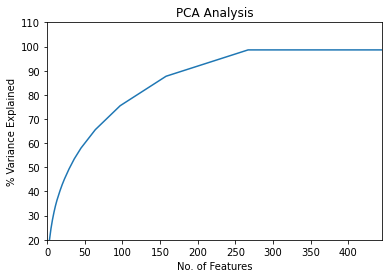

In [ ]:
#Find optimal number of features to reduce to by the number of features that allow us to capture 90% of the data's variance
plot_pca_variance_to_features(len(feature_ids), iter_1_clustering_df[feature_ids])

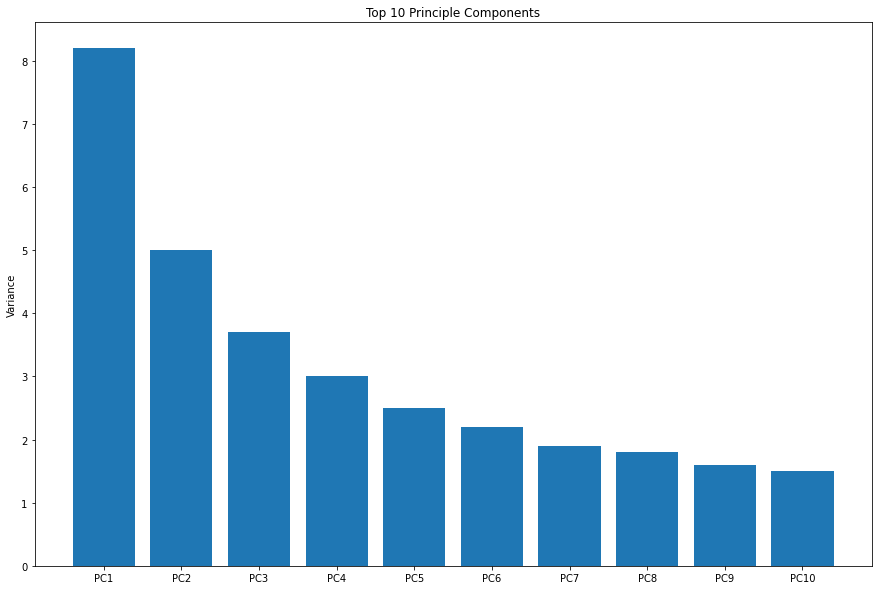

In [ ]:
#From the graph above, we want to use 200 features to keep 90% of the variance
pca = PCA(n_components=200)
data = pca.fit_transform(iter_1_clustering_df[feature_ids])

plt.figure(figsize=(15,10))
var = np.round(pca.explained_variance_ratio_*100, decimals = 1)
lbls = ['PC'+ str(x) for x in range(1,len(var)+1)]
plt.bar(x=range(1,len(var)+1)[0:10], height = var[0:10], tick_label = lbls[0:10])
plt.ylabel('Variance')
plt.title('Top 10 Principle Components')
plt.show()

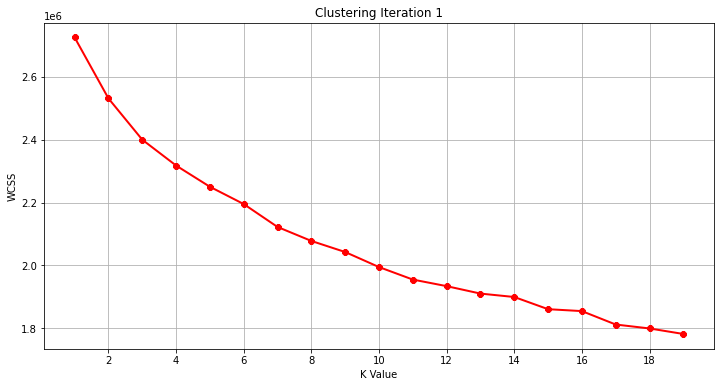

In [ ]:
#Takes a while to run
plot_elbow_curve(iter_1_clustering_df[feature_ids], "Clustering Iteration 1") 

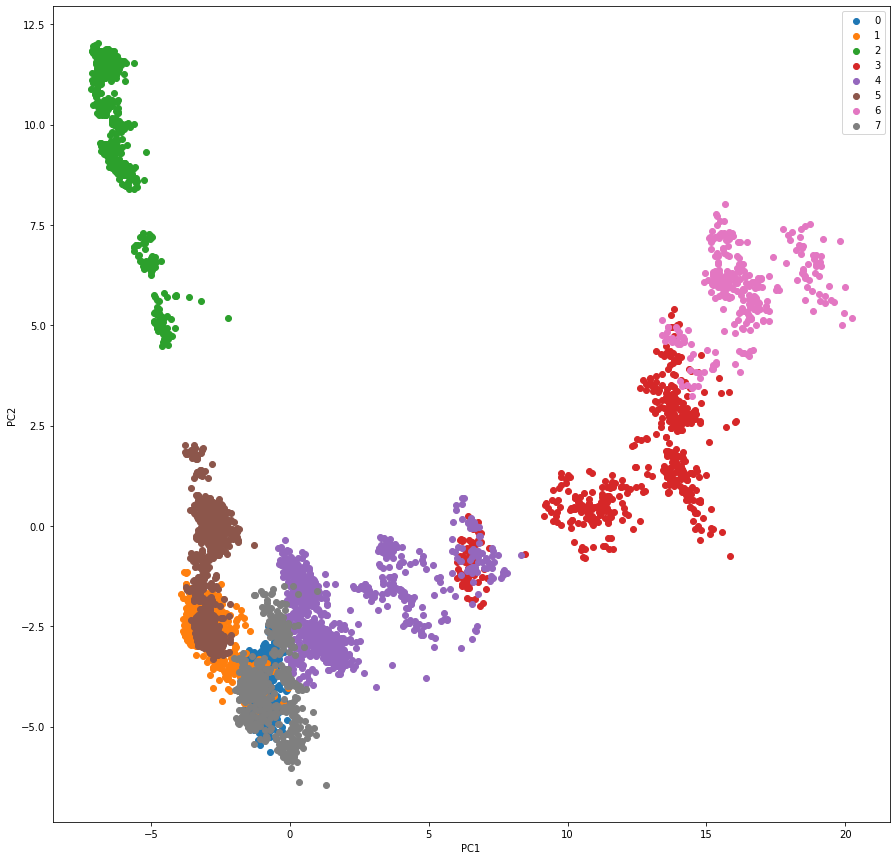

clustering_iter_1
1    1178
2    1144
6     837
3     756
7     670
0     647
4     565
5     314
Name: count, dtype: int64

In [ ]:
kmeans_summary_1 = kmeans_clustering_aves(8, data, average_df, "clustering_iter_1")
kmeans_summary_1["count"]

###Per Cluster Breakdown



PERSONA CLUSTER: 0 

NUMBER OF USERS IN CLUSTER: 647.0 

PERCENTAGE OF USERS IN CLUSTER: 10.587 



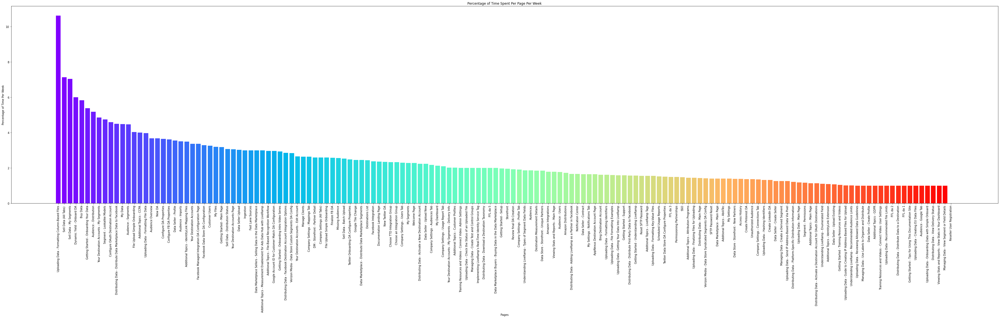

<Figure size 432x288 with 0 Axes>

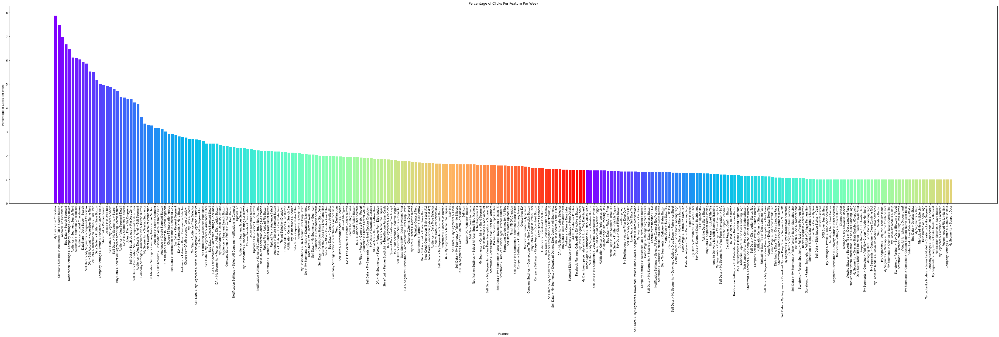

Top Pages on Left, Top Features on Right



,page
Uploading Data - Formatting Column-Based Files,10.622102
Sell Data (All Tabs),7.131249
Sell Data - My Segments,7.034143
Dynamic Yield - Onboard DA,6.000000
Buy Data,5.831984
Getting Started - Onboarding Your Data,5.377125
Audience - Distribution,5.179388
Your Destination Accounts - My Segments,4.853074
,feature
My Files > File Checkbox,7.876897


In [ ]:
#Illuminate the cluster's details
cluster_means_and_plots_both(kmeans_summary_1, 8, 0)



PERSONA CLUSTER: 1 

NUMBER OF USERS IN CLUSTER: 1178.0 

PERCENTAGE OF USERS IN CLUSTER: 19.277 



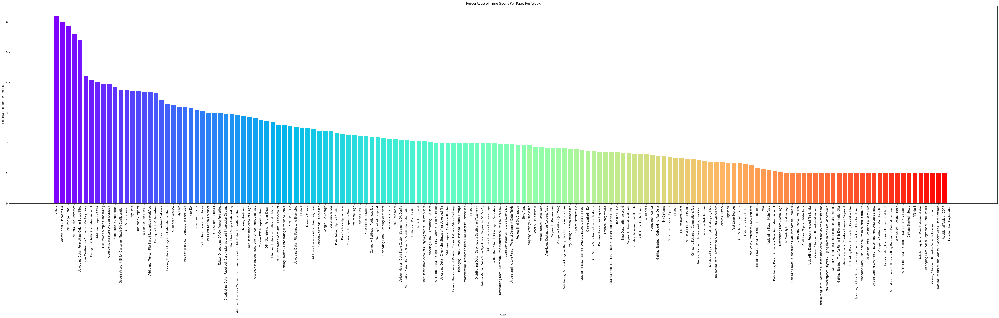

<Figure size 432x288 with 0 Axes>

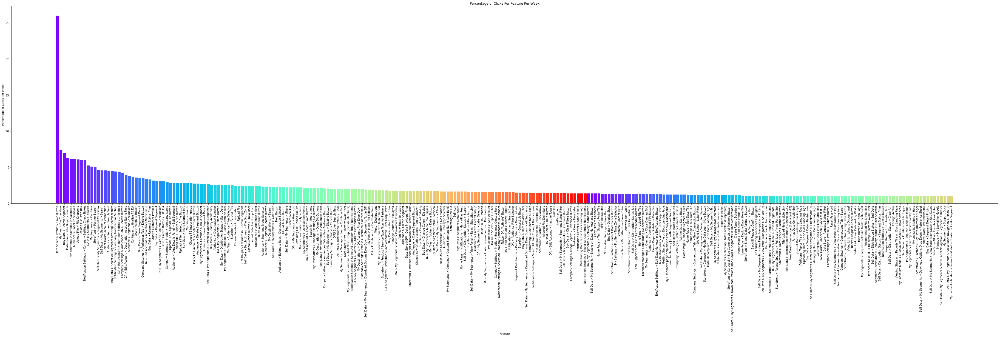

Top Pages on Left, Top Features on Right



,page
Buy Data,6.212650
Dynamic Yield - Onboard DA,6.000000
Sell Data (All Tabs),5.866323
Sell Data - My Segments,5.590707
Uploading Data - Formatting Column-Based Files,5.409168
Your Destination Accounts - My Segments,4.208501
Configure OAuth Destination Account,4.087842
Additional Topics - CCPA,4.000000
,feature
Data Seller > Profile > Save Button,26.000000


In [ ]:
#Illuminate the cluster's details
cluster_means_and_plots_both(kmeans_summary_1, 8, 1)



PERSONA CLUSTER: 2 

NUMBER OF USERS IN CLUSTER: 1144.0 

PERCENTAGE OF USERS IN CLUSTER: 18.72 



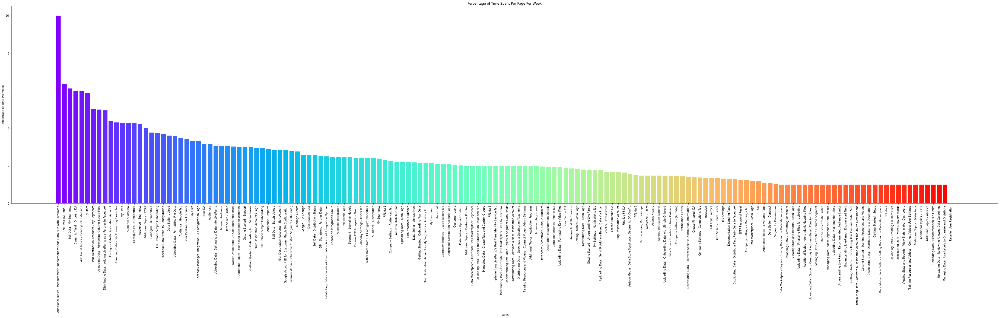

<Figure size 432x288 with 0 Axes>

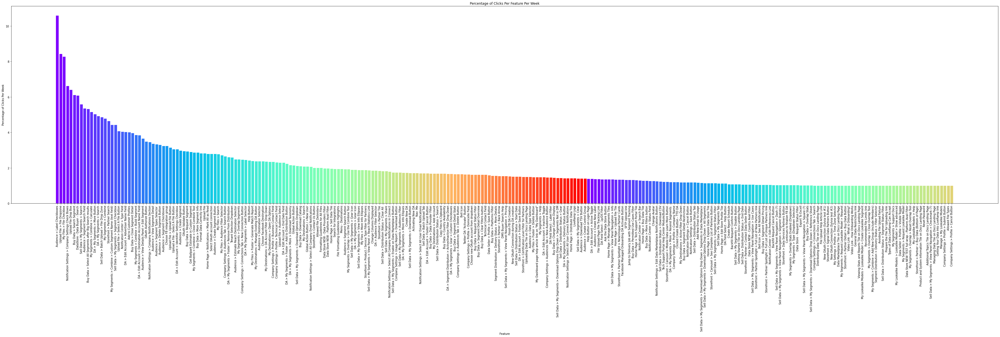

Top Pages on Left, Top Features on Right



,page
Additional Topics - Measurement Enablement for Ads Data Hub with LiveRamp,10.000000
Sell Data (All Tabs),6.347583
Sell Data - My Segments,6.111643
Dynamic Yield - Onboard DA,6.000000
Additional Topics - IdentityLink Extension,6.000000
Buy Data,5.883305
Your Destination Accounts - My Segments,5.017784
Uploading Data - Formatting Column-Based Files,5.000000
,feature
Audience > Label Checkboxes,10.587239


In [ ]:
#Illuminate the cluster's details
cluster_means_and_plots_both(kmeans_summary_1, 8, 2)



PERSONA CLUSTER: 3 

NUMBER OF USERS IN CLUSTER: 756.0 

PERCENTAGE OF USERS IN CLUSTER: 12.371 



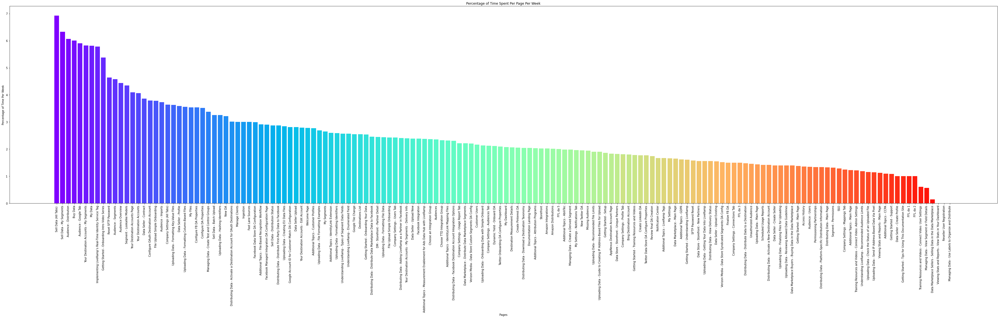

<Figure size 432x288 with 0 Axes>

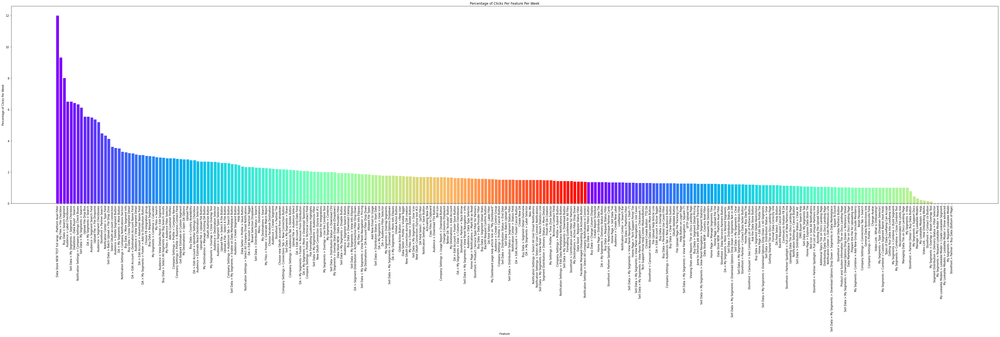

Top Pages on Left, Top Features on Right



,page
Sell Data (All Tabs),6.927569
Sell Data - My Segments,6.330484
Audience - Distribution,6.065196
Buy Data,6.005730
Audience - Google Tab,5.902447
Your Destination Accounts - My Segments,5.818715
My Data,5.814995
Implementing LiveRamp’s Real-Time Identity Service Tag,5.787037
,feature
Data Store NEW TEST full wrap - Platform Avail Filter,12.000000


In [ ]:
#Illuminate the cluster's details
cluster_means_and_plots_both(kmeans_summary_1, 8, 3)



PERSONA CLUSTER: 4 

NUMBER OF USERS IN CLUSTER: 565.0 

PERCENTAGE OF USERS IN CLUSTER: 9.246 



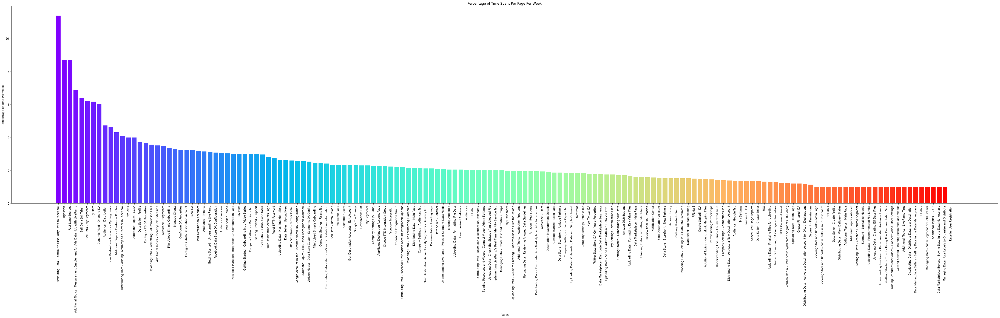

<Figure size 432x288 with 0 Axes>

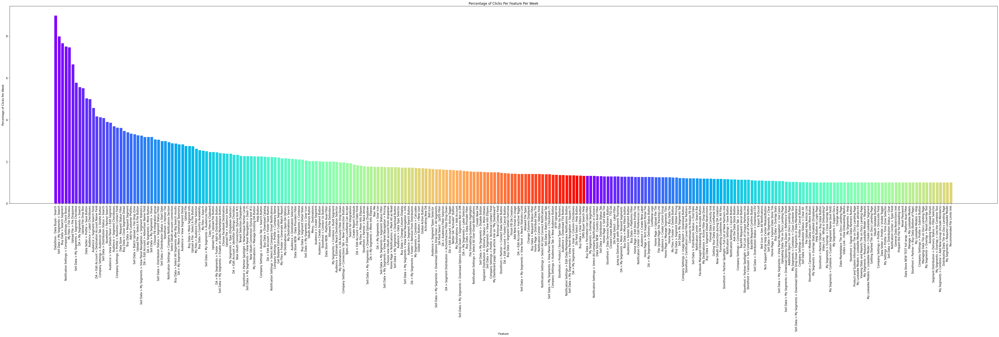

Top Pages on Left, Top Features on Right



,page
Distributing Data - Distribute First-Party Data to Facebook,11.394690
Ingestion,8.720622
Fast Lane Sources,8.720622
Additional Topics - Measurement Enablement for Ads Data Hub with LiveRamp,6.888496
Sell Data (All Tabs),6.390929
Sell Data - My Segments,6.203612
Buy Data,6.170405
Dynamic Yield - Onboard DA,6.000000
,feature
DataStore - Data Buyer - Search,8.981709


In [ ]:
#Illuminate the cluster's details
cluster_means_and_plots_both(kmeans_summary_1, 8, 4)



PERSONA CLUSTER: 5 

NUMBER OF USERS IN CLUSTER: 314.0 

PERCENTAGE OF USERS IN CLUSTER: 5.138 



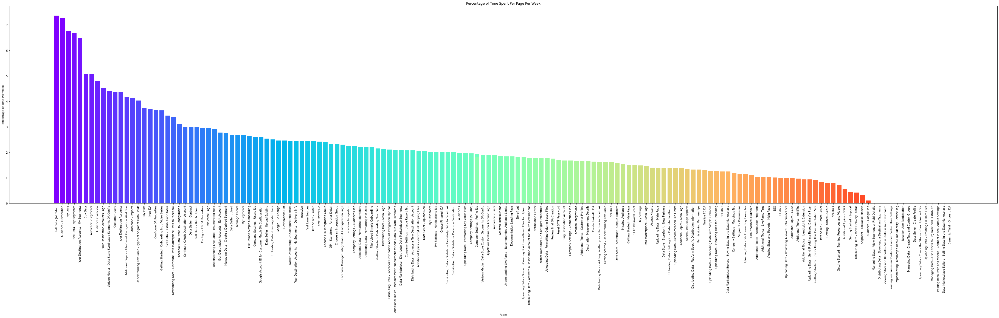

<Figure size 432x288 with 0 Axes>

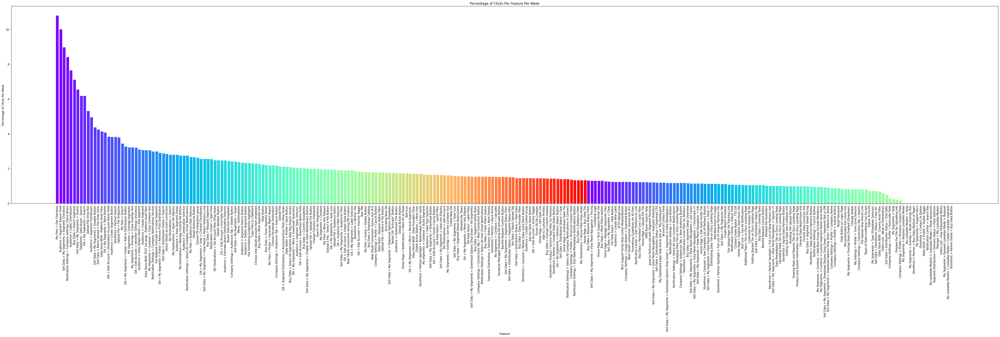

Top Pages on Left, Top Features on Right



,page
Sell Data (All Tabs),7.369726
Audience - Distribution,7.254997
My Data,6.751322
Sell Data - My Segments,6.678404
Your Destination Accounts - My Segments,6.483524
Buy Data,5.084603
Audience - Segments,5.069063
Audience Overview,4.801626
,feature
My Files > File Checkbox,10.795261


In [ ]:
#Illuminate the cluster's details
cluster_means_and_plots_both(kmeans_summary_1, 8, 5)



PERSONA CLUSTER: 6 

NUMBER OF USERS IN CLUSTER: 837.0 

PERCENTAGE OF USERS IN CLUSTER: 13.697 



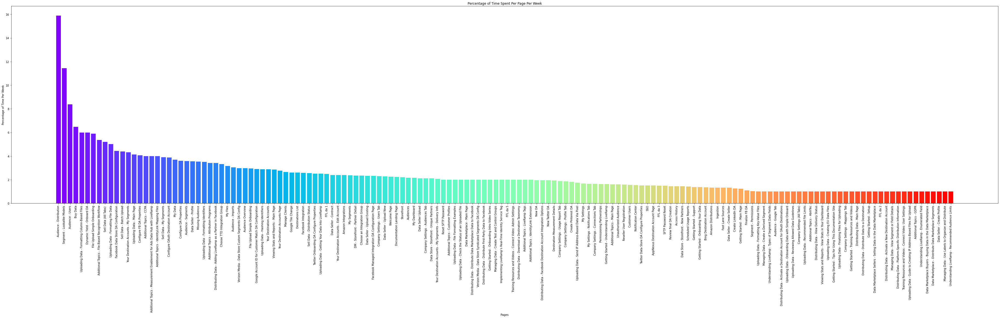

<Figure size 432x288 with 0 Axes>

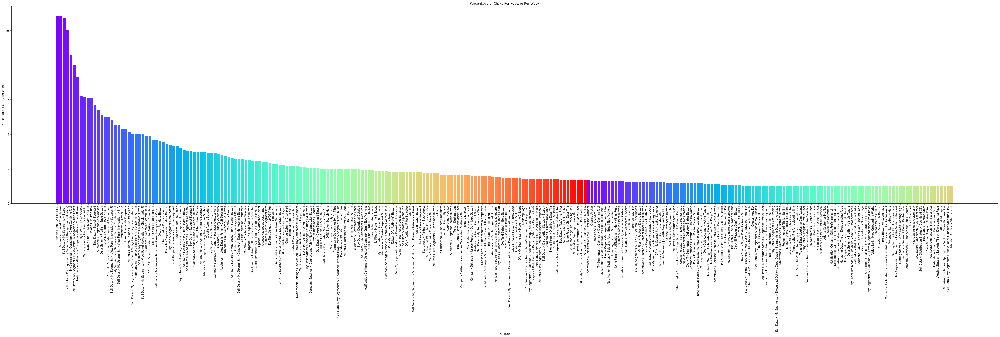

Top Pages on Left, Top Features on Right



,page
Audience - Distribution,15.896726
Segment - Lookalike Models,11.433366
Audience - Users,8.379313
Buy Data,6.470423
Uploading Data - Formatting Column-Based Files,6.000000
Dynamic Yield - Onboard DA,6.000000
File Upload Simple Onboarding,5.890084
Additional Topics - File-Based Recognition Workflow,5.360812
,feature
My Segments > Combine,10.856631


In [ ]:
#Illuminate the cluster's details
cluster_means_and_plots_both(kmeans_summary_1, 8, 6)



PERSONA CLUSTER: 7 

NUMBER OF USERS IN CLUSTER: 670.0 

PERCENTAGE OF USERS IN CLUSTER: 10.964 



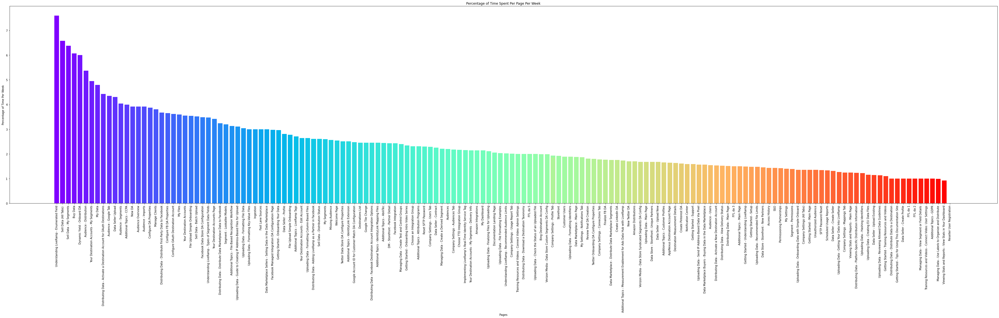

<Figure size 432x288 with 0 Axes>

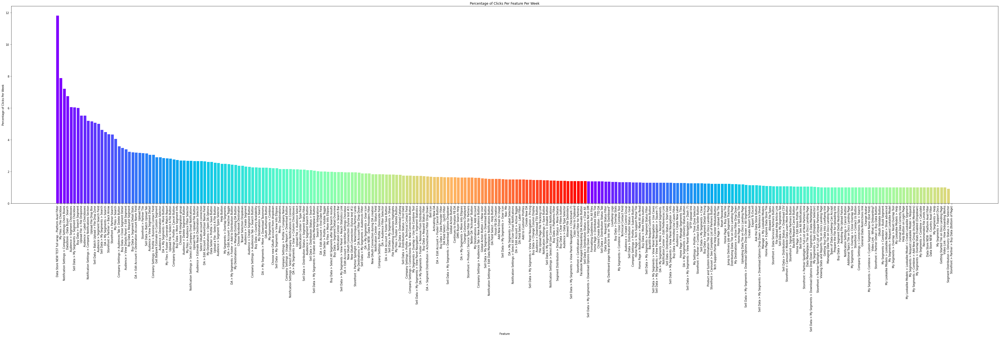

Top Pages on Left, Top Features on Right



,page
Understanding LiveRamp - Enumerated Field,7.600000
Sell Data (All Tabs),6.574354
Sell Data - My Segments,6.382995
Buy Data,6.068801
Dynamic Yield - Onboard DA,6.000000
Audience - Distribution,5.371771
Your Destination Accounts - My Segments,4.950203
My Data,4.795678
,feature
Data Store NEW TEST full wrap - Platform Avail Filter,11.819403


In [ ]:
#Illuminate the cluster's details
cluster_means_and_plots_both(kmeans_summary_1, 8, 7)

Doing the above for each cluster reveals using all the features and pages clutter our understanding of the grouping

##Iteration 2: KMeans, PCA, Daily Percentage Data
This iteration kept everything the same as the previous except for the data preprocessing and feature selection (we used only a subset of pages as our clustering features). We aggregated the interaction data by day and created percentages out of it in order to more easily compare across users that spend different amounts of time in the platform and ensure we are not over indexing on that metric in our clustering (i.e. user X spends 50% of their time on page Y per day, 10% on page Z). The results did not seem to have as much structure as our first iteration visually. After reviewing with our internal data science team we uncovered that our data was likely not suited for PCA and KMeans since it is sparse, nonlinear, categorical, and non-normally distributed. But the results seemed to be more promising from a cluster interpretability perspective, with significant and legible differences per cluster that could be used to come up with persona labels. The resulting 8 personas that were generated, though, seemed too granular in comparison to qualitative personas being pieced together from interviews. When diminishing the K value, we would lose clusters representing personas we knew to be separate and distinct from interviews but seemed to not have enough signal to warrant its own grouping in the data. 

###Clustering

In [ ]:
#Dataset we will use to base our clustering on this iteration
%%bigquery --project uxr-design-us-dev percentage_per_day_df
SELECT * FROM `uxr-design-us-dev.clustering_datasets.time_percentage_clustering_data`

In [ ]:
#Grabbing the ids and names to create a table of relevant clustering features
%%bigquery --project uxr-design-us-dev id_name_mapping
SELECT distinct feature_id as id, feature_name as name, page_id as parent_id, page_name as parent_name, group_name, is_core_event, app, "feature" as type 
FROM `mixed_methods_clustering.all_features_telemetry_data_per_week_deduped`

UNION ALL

SELECT distinct page_id as id, page_name as name, "" as parent_id, "" as parent_name, group_name, False as is_core_event, app, "page" as type 
FROM `mixed_methods_clustering.all_pages_telemetry_data_per_week_deduped`

In [ ]:
#IDs of the relevant pages and features in the average percentage dataset
ids = percentage_per_day_df.columns.to_list()[2::]

#Create mapping table of reformatted id to name
id_name_mapping["reformatted_id"] = "_" + id_name_mapping["id"].str.replace('-', '_')
id_name_mapping = id_name_mapping[id_name_mapping["reformatted_id"].isin(ids)]

#Create list of page names and ids
page_names = id_name_mapping[id_name_mapping["type"] == "page"]["name"].to_list()
p_ids = id_name_mapping[id_name_mapping["type"] == "page"]["reformatted_id"].to_list()

#Create list of feature names and ids
feature_names = []
f_ids = []

#All clustering feature ids
feature_ids = p_ids + f_ids

In [ ]:
iter_2_clustering_df = percentage_per_day_df.copy()

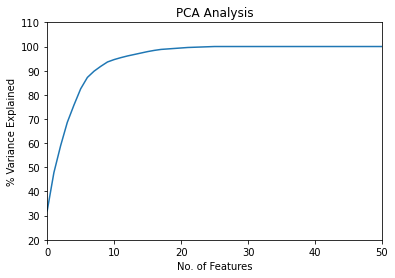

In [ ]:
#Find optimal number of features to reduce to by the number of features that allow us to capture 90% of the data's variance
plot_pca_variance_to_features(len(feature_ids), iter_2_clustering_df[feature_ids])

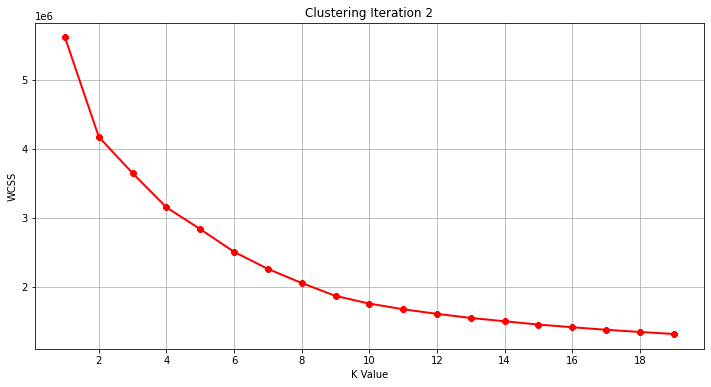

In [ ]:
#Plot the elbow curve to find the best value for k
plot_elbow_curve(iter_2_clustering_df[feature_ids], "Clustering Iteration 2") 

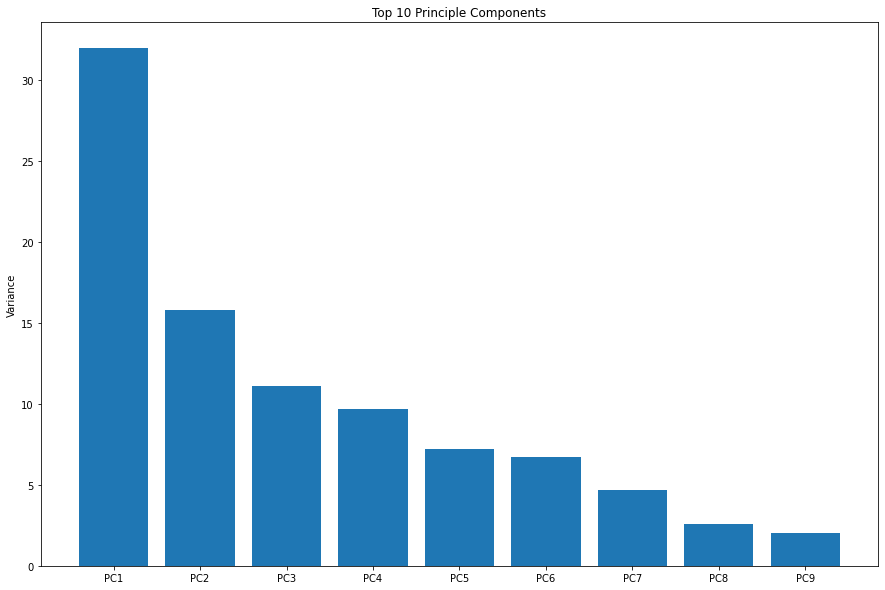

In [ ]:
#From the graph above, we want to use 200 features to keep 90% of the variance
pca = PCA(n_components=9)
data = pca.fit_transform(iter_2_clustering_df[feature_ids])

plt.figure(figsize=(15,10))
var = np.round(pca.explained_variance_ratio_*100, decimals = 1)
lbls = ['PC'+ str(x) for x in range(1,len(var)+1)]
plt.bar(x=range(1,len(var)+1)[0:10], height = var[0:10], tick_label = lbls[0:10])
plt.ylabel('Variance')
plt.title('Top 10 Principle Components')
plt.show()

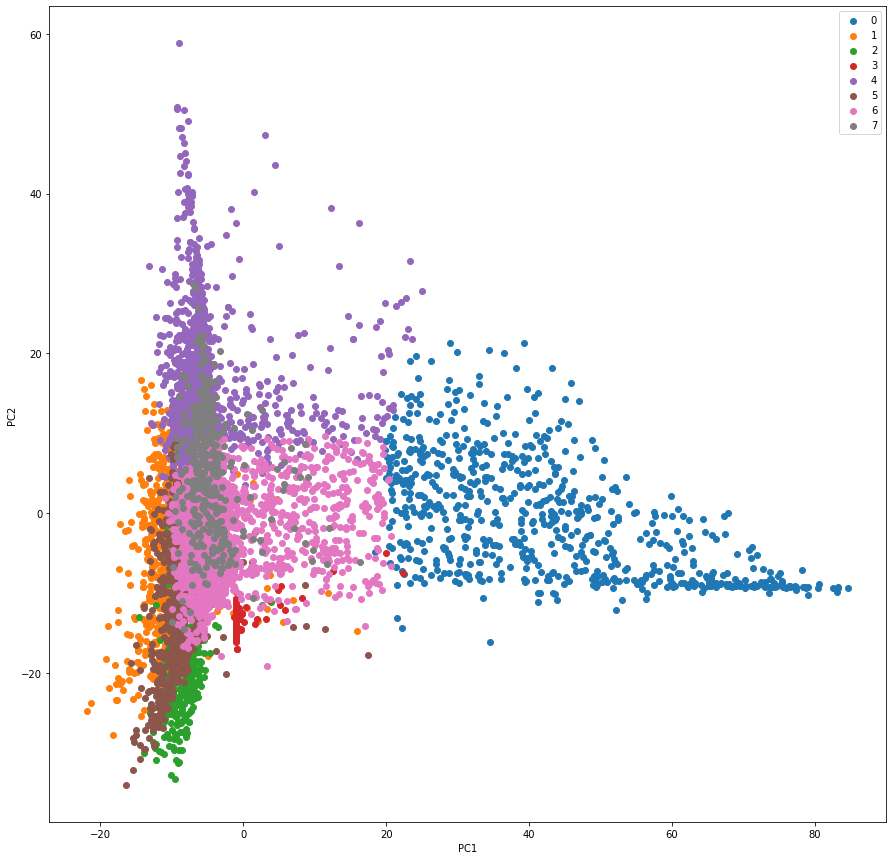

clustering_iter_2
6    2097
4    1322
1     732
0     696
5     656
7     390
2     326
3     106
Name: count, dtype: int64

In [ ]:
kmeans_summary_2 = kmeans_clustering_aves(8, data, iter_2_clustering_df, "clustering_iter_2")
kmeans_summary_2["count"]

###Per Cluster Breakdown and Persona Labels



PERSONA CLUSTER: 0 

NUMBER OF USERS IN CLUSTER: 696.0 

PERCENTAGE OF USERS IN CLUSTER: 11.004 



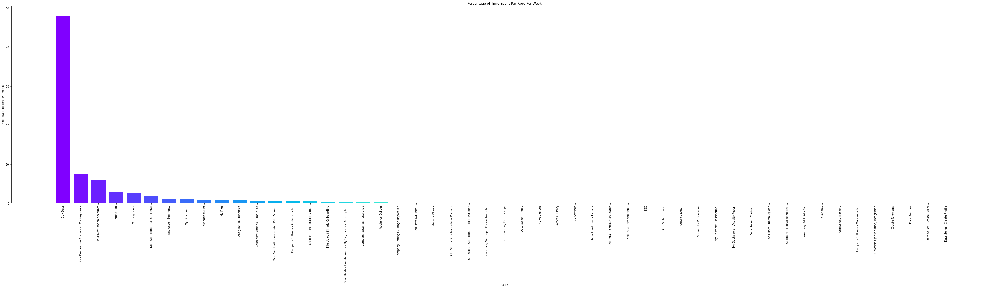

Top Pages on Left, Top Features on Right



,page
Buy Data,48.101580
Your Destination Accounts - My Segments,7.623276
Your Destination Accounts,5.811494
Storefront,2.955029
My Segments,2.705747
DM - Storefront - Partner Detail,1.905316
Audience - Segments,1.109483
My Dashboard,1.058046
Destinations List,0.881753
My Files,0.702874


In [ ]:
#Illuminate the cluster's details
cluster_means_and_plots_both(kmeans_summary_2, 10, 0)



PERSONA CLUSTER: 1 

NUMBER OF USERS IN CLUSTER: 732.0 

PERCENTAGE OF USERS IN CLUSTER: 11.573 



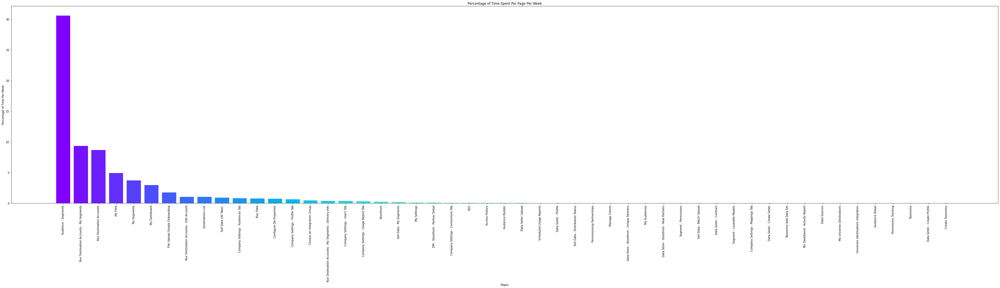

Top Pages on Left, Top Features on Right



,page
Audience - Segments,30.608197
Your Destination Accounts - My Segments,9.323634
Your Destination Accounts,8.664891
My Files,4.905055
My Segments,3.727596
My Dashboard,2.961885
FIle Upload Simple Onboarding,1.733470
Your Destination Accounts - Edit Account,1.031831
Destinations List,1.025137
Sell Data (All Tabs),0.928142


In [ ]:
#Illuminate the cluster's details
cluster_means_and_plots_both(kmeans_summary_2, 10, 1)



PERSONA CLUSTER: 2 

NUMBER OF USERS IN CLUSTER: 326.0 

PERCENTAGE OF USERS IN CLUSTER: 5.154 



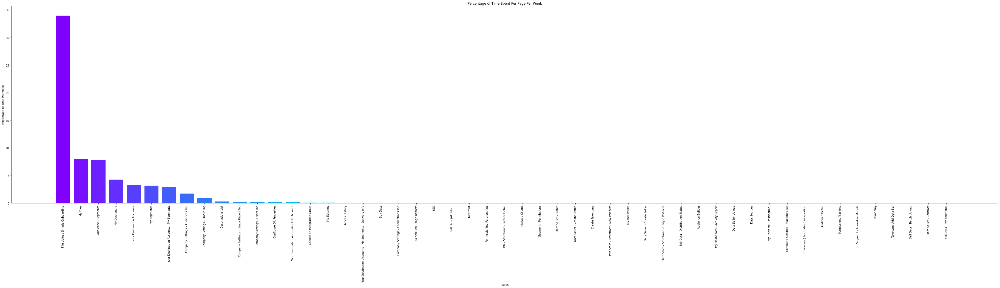

Top Pages on Left, Top Features on Right



,page
FIle Upload Simple Onboarding,33.996626
My Files,8.052454
Audience - Segments,7.869632
My Dashboard,4.257669
Your Destination Accounts,3.321472
My Segments,3.191718
Your Destination Accounts - My Segments,3.000000
Company Settings - Audiences Tab,1.771779
Company Settings - Profile Tab,0.992638
Destinations List,0.307362


In [ ]:
#Illuminate the cluster's details
cluster_means_and_plots_both(kmeans_summary_2, 10, 2)



PERSONA CLUSTER: 3 

NUMBER OF USERS IN CLUSTER: 106.0 

PERCENTAGE OF USERS IN CLUSTER: 1.676 



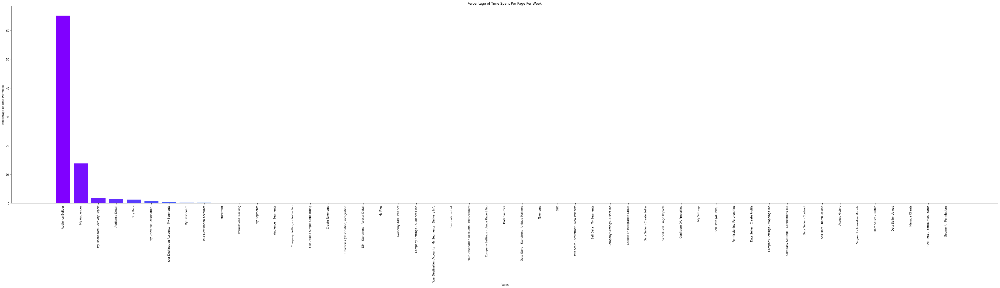

Top Pages on Left, Top Features on Right



,page
Audience Builder,65.199057
My Audiences,13.781132
My Dashbaord - Activity Report,1.935849
Audience Detail,1.318868
Buy Data,1.230189
My Universe (Destination),0.711321
Your Destination Accounts - My Segments,0.355660
My Dashboard,0.211321
Your Destination Accounts,0.190566
Storefront,0.139623


In [ ]:
#Illuminate the cluster's details
cluster_means_and_plots_both(kmeans_summary_2, 10, 3)



PERSONA CLUSTER: 4 

NUMBER OF USERS IN CLUSTER: 1322.0 

PERCENTAGE OF USERS IN CLUSTER: 20.901 



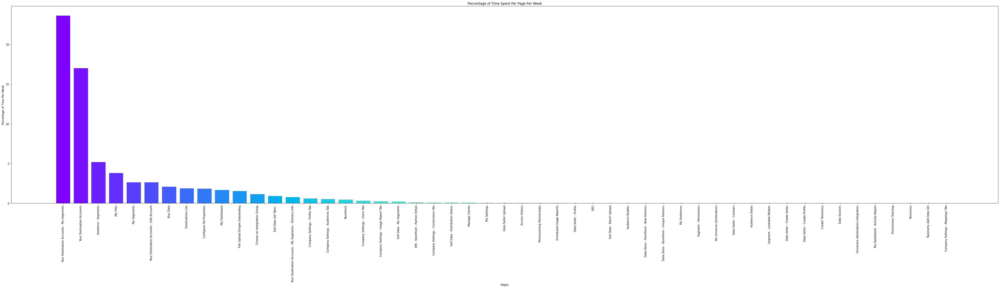

Top Pages on Left, Top Features on Right



,page
Your Destination Accounts - My Segments,23.619818
Your Destination Accounts,17.006808
Audience - Segments,5.169138
My Files,3.805749
My Segments,2.622617
Your Destination Accounts - Edit Account,2.620045
Buy Data,2.090318
Destinations List,1.855900
Configure DA Properties,1.828215
My Dashboard,1.665582


In [ ]:
#Illuminate the cluster's details
cluster_means_and_plots_both(kmeans_summary_2, 10, 4)



PERSONA CLUSTER: 5 

NUMBER OF USERS IN CLUSTER: 656.0 

PERCENTAGE OF USERS IN CLUSTER: 10.372 



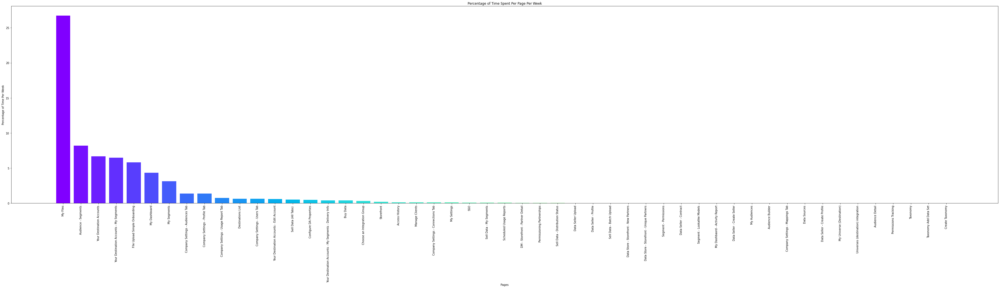

Top Pages on Left, Top Features on Right



,page
My Files,26.748780
Audience - Segments,8.201982
Your Destination Accounts,6.686585
Your Destination Accounts - My Segments,6.487348
FIle Upload Simple Onboarding,5.822104
My Dashboard,4.357622
My Segments,3.118140
Company Settings - Audiences Tab,1.371646
Company Settings - Profile Tab,1.364634
Company Settings - Usage Report Tab,0.742988


In [ ]:
#Illuminate the cluster's details
cluster_means_and_plots_both(kmeans_summary_2, 10, 5)



PERSONA CLUSTER: 6 

NUMBER OF USERS IN CLUSTER: 2097.0 

PERCENTAGE OF USERS IN CLUSTER: 33.154 



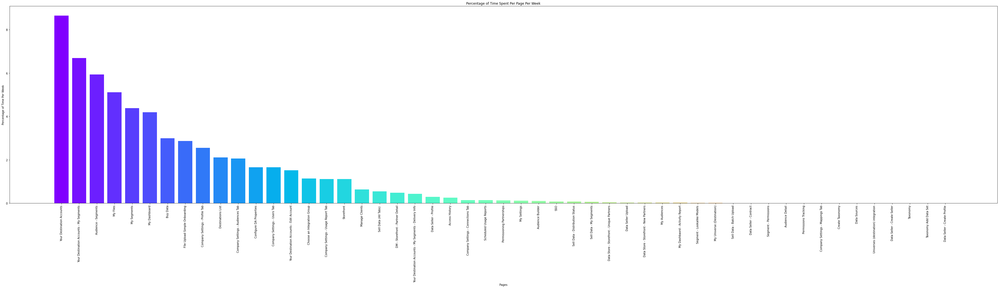

Top Pages on Left, Top Features on Right



,page
Your Destination Accounts,8.653267
Your Destination Accounts - My Segments,6.694468
Audience - Segments,5.938531
My Files,5.119504
My Segments,4.382356
My Dashboard,4.192465
Buy Data,2.993038
FIle Upload Simple Onboarding,2.862423
Company Settings - Profile Tab,2.551216
Destinations List,2.110014


In [ ]:
#Illuminate the cluster's details
cluster_means_and_plots_both(kmeans_summary_2, 10, 6)



PERSONA CLUSTER: 7 

NUMBER OF USERS IN CLUSTER: 390.0 

PERCENTAGE OF USERS IN CLUSTER: 6.166 



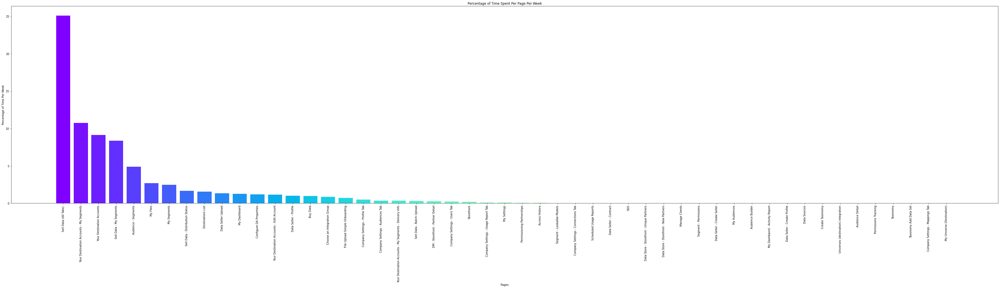

Top Pages on Left, Top Features on Right



,page
Sell Data (All Tabs),25.100513
Your Destination Accounts - My Segments,10.731282
Your Destination Accounts,9.113846
Sell Data - My Segments,8.372821
Audience - Segments,4.868462
My Files,2.684615
My Segments,2.457949
Sell Data - Distribution Status,1.674103
Destinations List,1.550000
Data Seller Upload,1.341026


In [ ]:
#Illuminate the cluster's details
cluster_means_and_plots_both(kmeans_summary_2, 10, 7)

##Iteration 3: KMeans, UMAP, Daily Percentage Data
This iteration kept the preprocessing and clustering algorithm the same, but changed the dimensionality reduction to be one more suited for the sparse, categorical dataset and included an expanded the clustering features to include core CTAs. The resulting seven personas (one not pictured in the above graph and hardcoded due to the use of a separate product in our suite, Advanced TV) seemed the most promising, but when communicated to internal stakeholders and teams caused some confusion. The main issue with this iteration was the concept of a “Distributor” persona, who mainly focuses on advertising distribution / activation. This was a sticky point since this task was seen as universal both internally and through the analytics data, a common and perhaps even necessary action to using the platform and not one that would warrant its own, separate persona. It was unclear if this was simply an interpretation / language problem or clustering one.

###Clustering

In [ ]:
%%bigquery --project uxr-design-us-dev percentage_per_day_combined_df
SELECT * EXCEPT (email, cluster, interviewed)
FROM `uxr-design-us-dev.clustering_datasets.ave_clicks_important_features_clustering_data` f
INNER JOIN `uxr-design-us-dev.clustering_datasets.personas_from_percentage_page_data` p
ON f.visitor_id = p.visitor_id

In [ ]:
#Separate out the advanced tv users since through user interviews we have established them as a separate cluster
non_adv_tv_df = percentage_per_day_combined_df[~((percentage_per_day_combined_df["cnt_app"] == 2) | (percentage_per_day_combined_df["persona_label"] == "tv_builder") | (percentage_per_day_combined_df["visitor_id"].str.contains("-")))]

adv_tv_df = percentage_per_day_combined_df[((percentage_per_day_combined_df["cnt_app"] == 2) | (percentage_per_day_combined_df["persona_label"] == "tv_builder") | (percentage_per_day_combined_df["visitor_id"].str.contains("-")))]
adv_tv_df["persona"] = "tv_user"
adv_tv_df.drop(columns=["persona_label", "cnt_app"], inplace=True)
non_adv_tv_df.drop(columns=["persona_label", "cnt_app"], inplace=True)

In [ ]:
percentage_per_day_combined_df = non_adv_tv_df

#Since the data is combined, drop the duplicate visitor_id column
percentage_per_day_combined_df = percentage_per_day_combined_df.drop(columns= ["visitor_id_1"])

#The dataset has columns that were incorrectly formatted- adjust here
percentage_per_day_combined_df = percentage_per_day_combined_df.rename(columns={"_visitor_id":"visitor_id"})

#IDs of the relevant pages and features in the average percentage dataset
ids = percentage_per_day_combined_df.columns.to_list()[1::]

#Create mapping table of reformatted id to name
id_name_mapping["reformatted_id"] = "_" + id_name_mapping["id"].str.replace('-', '_')
id_name_mapping = id_name_mapping[id_name_mapping["reformatted_id"].isin(ids)]

#Create list of page names and ids
page_names = id_name_mapping[id_name_mapping["type"] == "page"]["name"].to_list()
p_ids = id_name_mapping[id_name_mapping["type"] == "page"]["reformatted_id"].to_list()

#Create list of feature names and ids
feature_names = id_name_mapping[id_name_mapping["type"] == "feature"]["name"].to_list()
f_ids = id_name_mapping[id_name_mapping["type"] == "feature"]["reformatted_id"].to_list()

feature_ids = p_ids + f_ids
len(feature_ids)

80

In [ ]:
# Scaling the data to bring all the attributes to a comparable level
scaler = StandardScaler()
X_scaled = scaler.fit_transform(percentage_per_day_combined_df[ids])

# Normalizing the data so that the data
# approximately follows a Gaussian distribution
X_normalized = normalize(X_scaled)

# Converting the numpy array into a pandas DataFrame
X_normalized = pd.DataFrame(X_normalized)

# Renaming the columns
X_normalized.columns = ids

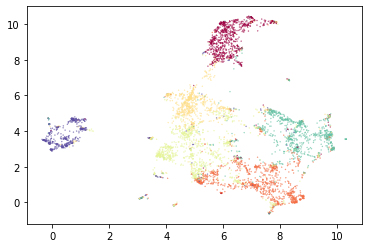

In [ ]:
#Create an embedding of the data to reduce the dimensionality
clusterable_embedding = umap.UMAP(
    n_neighbors=60,
    min_dist=0.0,
    n_components=2,
    random_state=42,
).fit_transform(X_normalized)


kmeans_umap_labels = cluster.KMeans(n_clusters=6).fit_predict(X_normalized)
plt.scatter(clusterable_embedding[:, 0], clusterable_embedding[:, 1], \
            c=kmeans_umap_labels, s=0.1, cmap='Spectral');

In [ ]:
cluster_name = "clustering_iter_3"
percentage_per_day_combined_df[cluster_name] = kmeans_umap_labels
kmeans_summary_3 = percentage_per_day_combined_df.groupby([cluster_name]).mean()
kmeans_summary_3['count'] = percentage_per_day_combined_df[cluster_name].value_counts()
kmeans_summary_3 = kmeans_summary_3.sort_values(by='count', ascending=False)

kmeans_summary_3['count']

clustering_iter_3
3    1007
1    1006
4     942
0     837
2     778
5     516
Name: count, dtype: int64

###Per Cluster Breakdown



PERSONA CLUSTER: 0 

NUMBER OF USERS IN CLUSTER: 837.0 

PERCENTAGE OF USERS IN CLUSTER: 16.457 



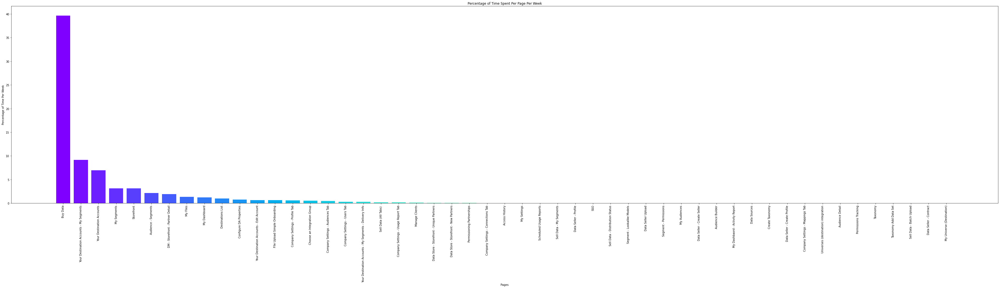

<Figure size 432x288 with 0 Axes>

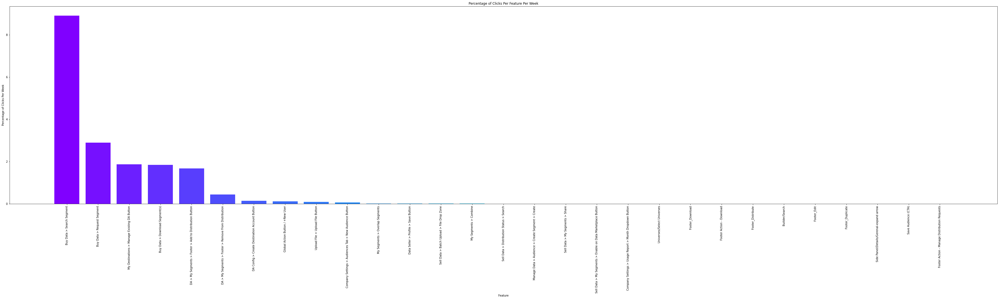

Top Pages on Left, Top Features on Right



,page
Buy Data,39.679809
Your Destination Accounts - My Segments,9.159020
Your Destination Accounts,6.959379
My Segments,3.147909
Storefront,3.117204
Audience - Segments,2.173596
DM - Storefront - Partner Detail,1.907885
My Files,1.340502
My Dashboard,1.207288
Destinations List,1.011111




PERSONA CLUSTER: 1 

NUMBER OF USERS IN CLUSTER: 1006.0 

PERCENTAGE OF USERS IN CLUSTER: 19.78 



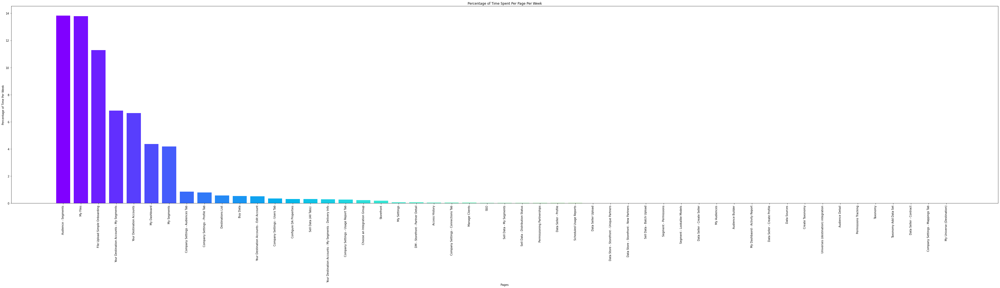

<Figure size 432x288 with 0 Axes>

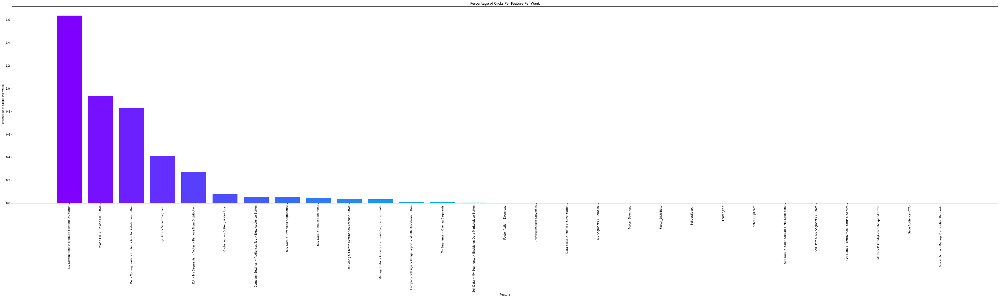

Top Pages on Left, Top Features on Right



,page
Audience - Segments,13.835984
My Files,13.794036
FIle Upload Simple Onboarding,11.288469
Your Destination Accounts - My Segments,6.823559
Your Destination Accounts,6.638668
My Dashboard,4.368191
My Segments,4.178231
Company Settings - Audiences Tab,0.854672
Company Settings - Profile Tab,0.794433
Destinations List,0.579026




PERSONA CLUSTER: 2 

NUMBER OF USERS IN CLUSTER: 778.0 

PERCENTAGE OF USERS IN CLUSTER: 15.297 



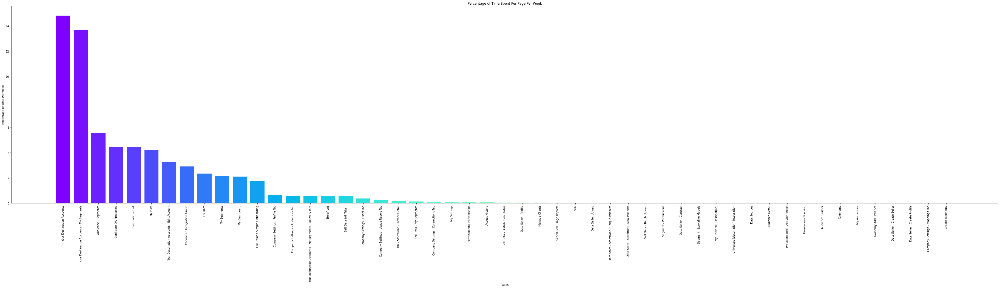

<Figure size 432x288 with 0 Axes>

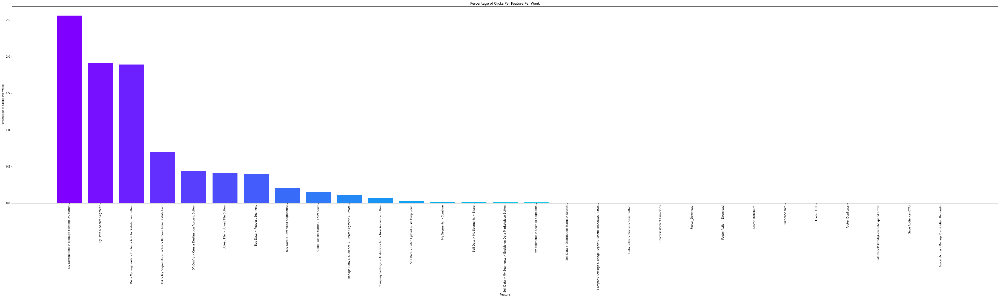

Top Pages on Left, Top Features on Right



,page
Your Destination Accounts,14.819794
Your Destination Accounts - My Segments,13.689203
Audience - Segments,5.525321
Configure DA Properties,4.455013
Destinations List,4.427121
My Files,4.193316
Your Destination Accounts - Edit Account,3.254756
Choose an Integration Group,2.894602
Buy Data,2.348586
My Segments,2.117995




PERSONA CLUSTER: 3 

NUMBER OF USERS IN CLUSTER: 1007.0 

PERCENTAGE OF USERS IN CLUSTER: 19.799 



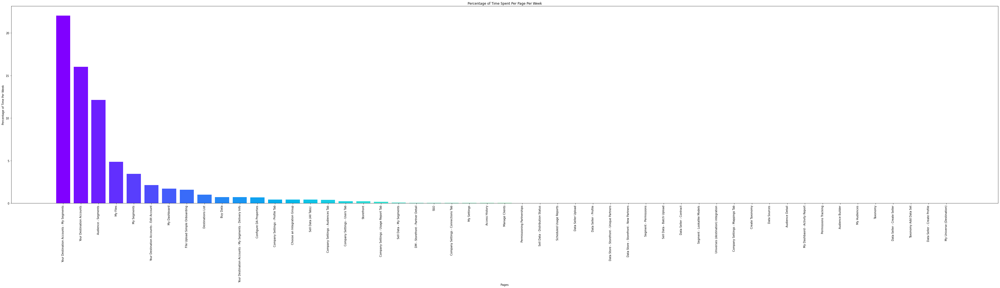

<Figure size 432x288 with 0 Axes>

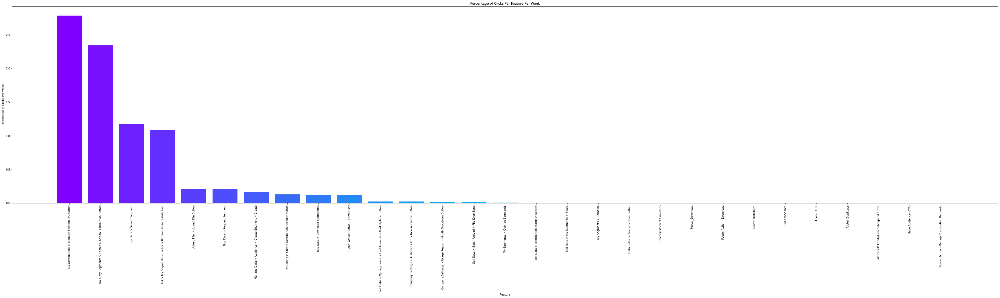

Top Pages on Left, Top Features on Right



,page
Your Destination Accounts - My Segments,22.042105
Your Destination Accounts,16.013803
Audience - Segments,12.128600
My Files,4.877855
My Segments,3.445482
Your Destination Accounts - Edit Account,2.124628
My Dashboard,1.710129
FIle Upload Simple Onboarding,1.592453
Destinations List,1.006058
Buy Data,0.726614




PERSONA CLUSTER: 4 

NUMBER OF USERS IN CLUSTER: 942.0 

PERCENTAGE OF USERS IN CLUSTER: 18.521 



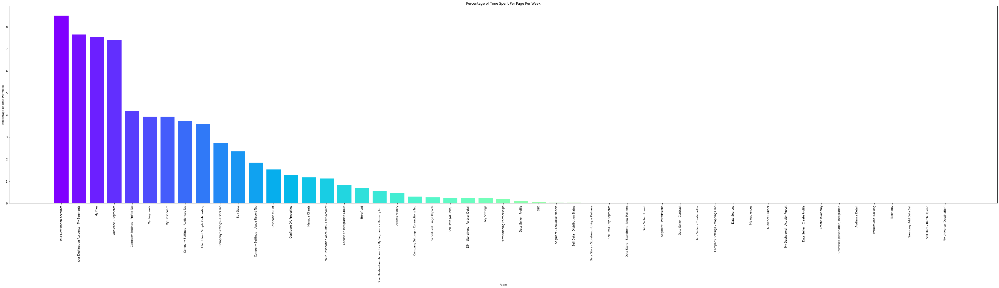

<Figure size 432x288 with 0 Axes>

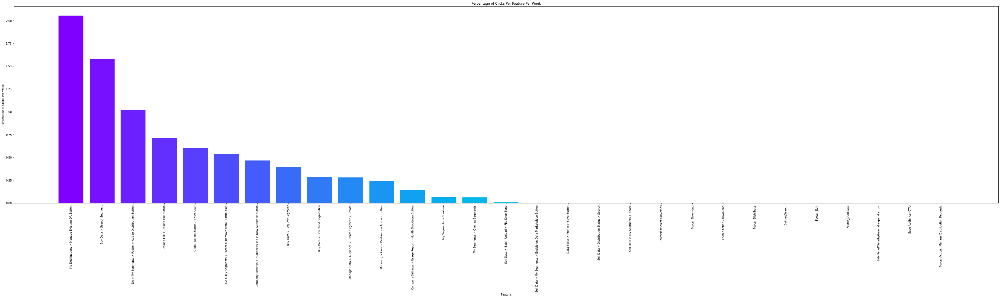

Top Pages on Left, Top Features on Right



,page
Your Destination Accounts,8.511040
Your Destination Accounts - My Segments,7.645117
My Files,7.548089
Audience - Segments,7.395966
Company Settings - Profile Tab,4.190870
My Segments,3.928981
My Dashboard,3.920488
Company Settings - Audiences Tab,3.720913
FIle Upload Simple Onboarding,3.574204
Company Settings - Users Tab,2.719002




PERSONA CLUSTER: 5 

NUMBER OF USERS IN CLUSTER: 516.0 

PERCENTAGE OF USERS IN CLUSTER: 10.145 



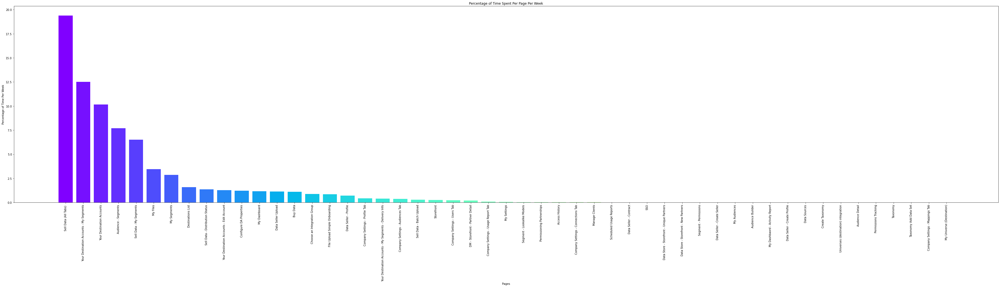

<Figure size 432x288 with 0 Axes>

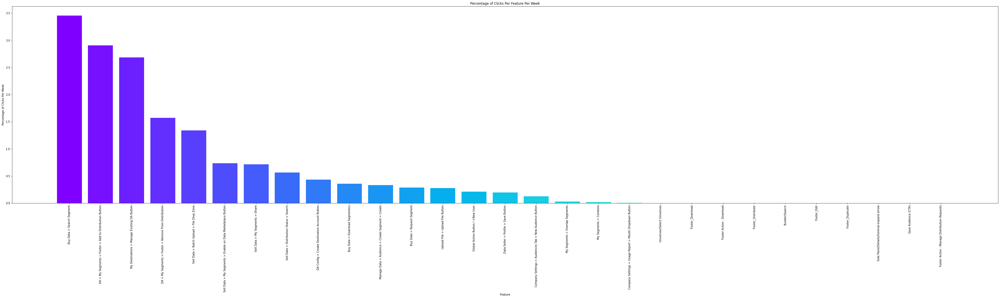

Top Pages on Left, Top Features on Right



,page
Sell Data (All Tabs),19.395930
Your Destination Accounts - My Segments,12.504845
Your Destination Accounts,10.151163
Audience - Segments,7.709496
Sell Data - My Segments,6.503295
My Files,3.460465
My Segments,2.856589
Destinations List,1.592442
Sell Data - Distribution Status,1.378295
Your Destination Accounts - Edit Account,1.280233


In [ ]:
cluster_means_and_plots_both(kmeans_summary_3, 10, 0) 
cluster_means_and_plots_both(kmeans_summary_3, 10, 1) 
cluster_means_and_plots_both(kmeans_summary_3, 10, 2) 
cluster_means_and_plots_both(kmeans_summary_3, 10, 3) 
cluster_means_and_plots_both(kmeans_summary_3, 10, 4)
cluster_means_and_plots_both(kmeans_summary_3, 10, 5)

##Iteration 4: HDBScan, UMAP, Weekly Percentage Data
By seeking to analyze and address the questions that arose from the prior iteration, we realized that we were dimming certain signals by aggregating the data to be per day since many of our processes take 1- 3 business days and a substantial number of users visit our platform on a weekly basis rather than a daily basis. 

With this iteration, we changed our preprocessing to create percentage data based on weekly interactions (i.e. user X spends 50% of time per week on page Y). We also decided to use HDBScan, a hierarchical density based clustering method that detects the number of clusters since it would be better suited for our dataset and not require us to bias our persona generation by hardcoding the number of clusters. KMeans makes certain assumptions about the qualities of the clusters that our visualizations and analytics showed to not be true, such as the data being “round” or spherical, equally sized, equally dense, most dense in the center of the sphere, and not contaminated by noise/outliers. Like the previous iteration, we removed our already identified cluster of TV users from the dataset. 

With the first pass, we generated four distinct clusters. The largest cluster, which we named “Generalist,” seemed to represent users of our core offering and user experience, which seemed to not have nuances loud enough to warrant a separate cluster within the larger dataset. The other three clusters aligned with those that were already identified from user interviews but were now backed by data and could be further examined. 

We then ran a second pass on just the generalist cluster with the same methodology and found that a sub persona had a strong enough signal to be clustered when just looking at this sample set. This persona was then added to our list, resulting in six total personas. 

In [ ]:
#Combining the average percentage data on the pages and features
%%bigquery --project uxr-design-us-dev percentage_per_week_df
SELECT * EXCEPT(_email)
FROM `mixed_methods_clustering.ave_percentage_of_clicks_per_feature_clustering_dataset_create_segment_update` f
INNER JOIN `mixed_methods_clustering.ave_percentage_of_time_on_page_clustering_dataset_create_segment_update` p
ON f._visitor_id = p._visitor_id

In [ ]:
#Since the data is combined, drop the duplicate visitor_id column
percentage_per_week_df = percentage_per_week_df.drop(columns= ["_visitor_id_1"])

#The dataset has columns that were incorrectly formatted- adjust here
percentage_per_week_df = percentage_per_week_df.rename(columns={"_visitor_id":"visitor_id"})

In [ ]:
# Scaling the data to bring all the attributes to a comparable level
scaler = StandardScaler()
X_scaled = scaler.fit_transform(percentage_per_week_df[ids])

# Normalizing the data so that the data
# approximately follows a Gaussian distribution
X_normalized = normalize(X_scaled)

# Converting the numpy array into a pandas DataFrame
X_normalized = pd.DataFrame(X_normalized)

# Renaming the columns
X_normalized.columns = X[ids].columns

Percent Clustered: 89


PERSONA CLUSTER: 0 

NUMBER OF USERS IN CLUSTER: 836.0 

PERCENTAGE OF USERS IN CLUSTER: 13.182 



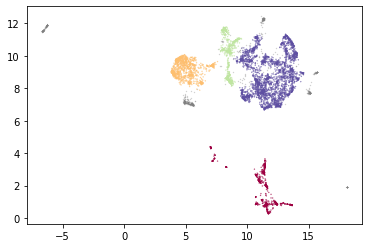

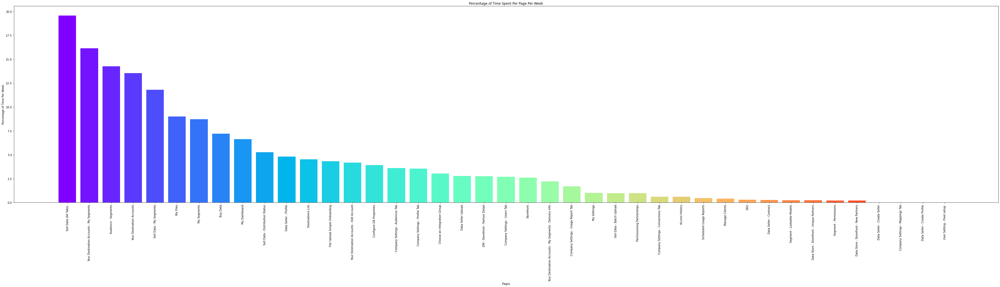

<Figure size 432x288 with 0 Axes>

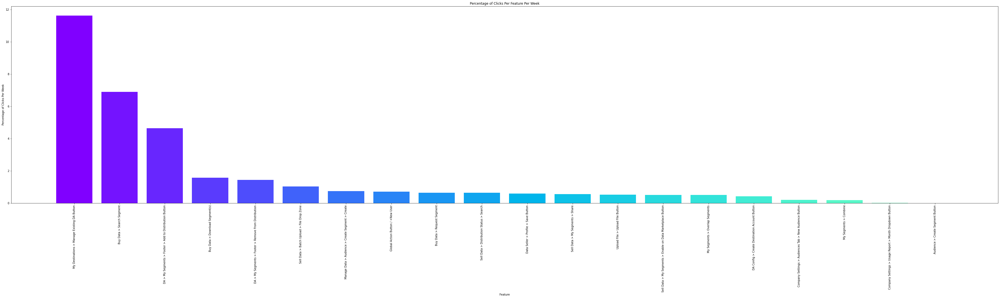

Top Pages on Left, Top Features on Right



,page
name,
Sell Data (All Tabs),19.581599
Your Destination Accounts - My Segments,16.130578
Audience - Segments,14.269533
Your Destination Accounts,13.545687
Sell Data - My Segments,11.797409
My Files,9.006896
My Segments,8.709249
Buy Data,7.203044
My Dashboard,6.629839




PERSONA CLUSTER: 1 

NUMBER OF USERS IN CLUSTER: 1107.0 

PERCENTAGE OF USERS IN CLUSTER: 17.455 



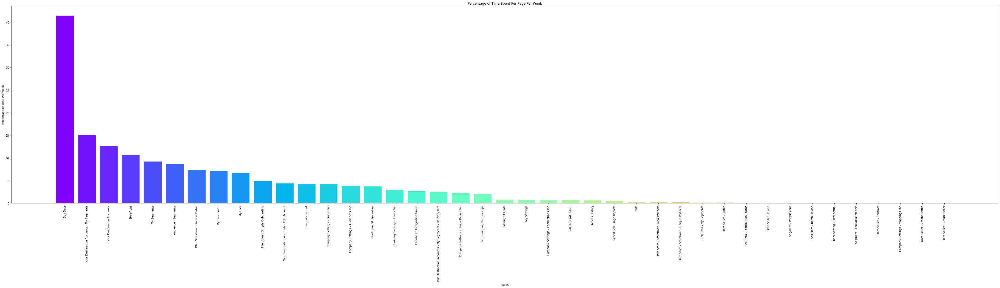

<Figure size 432x288 with 0 Axes>

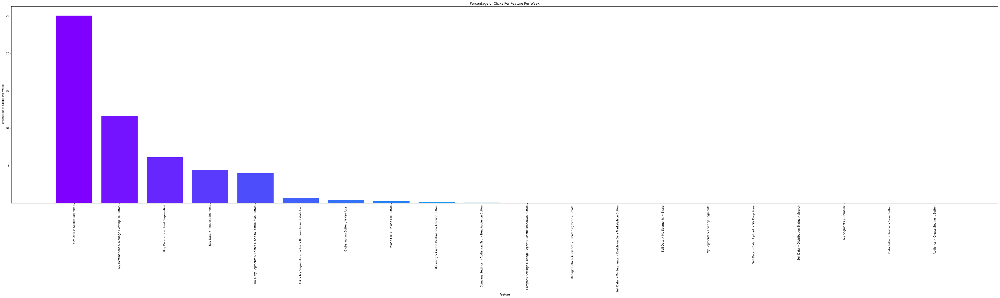

Top Pages on Left, Top Features on Right



,page
name,
Buy Data,41.474597
Your Destination Accounts - My Segments,15.024497
Your Destination Accounts,12.579695
Storefront,10.752743
My Segments,9.219443
Audience - Segments,8.635319
DM - Storefront - Partner Detail,7.344499
My Dashboard,7.173670
My Files,6.690887




PERSONA CLUSTER: 2 

NUMBER OF USERS IN CLUSTER: 707.0 

PERCENTAGE OF USERS IN CLUSTER: 11.148 



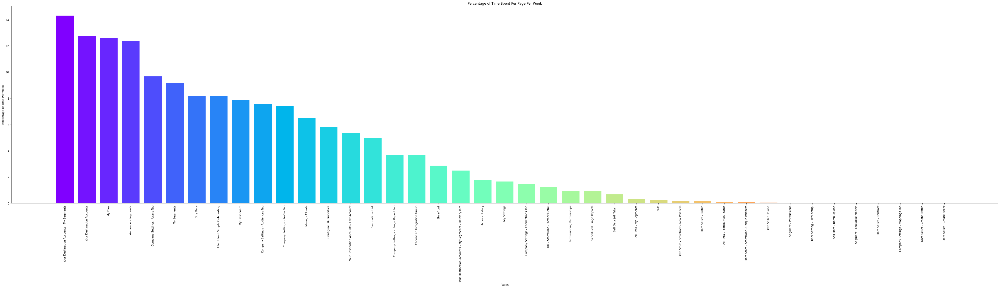

<Figure size 432x288 with 0 Axes>

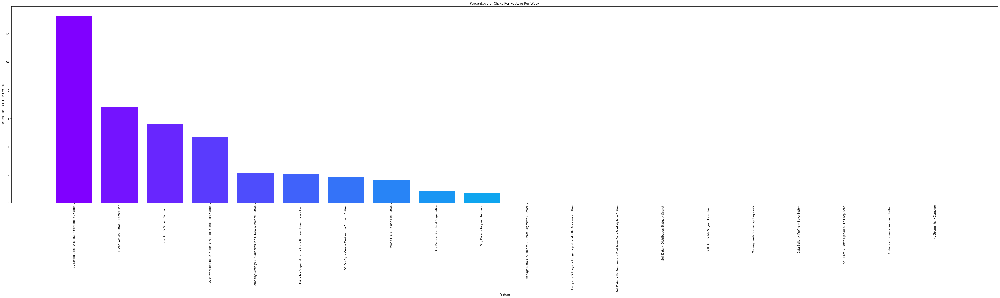

Top Pages on Left, Top Features on Right



,page
name,
Your Destination Accounts - My Segments,14.314030
Your Destination Accounts,12.744009
My Files,12.582974
Audience - Segments,12.351063
Company Settings - Users Tab,9.663632
My Segments,9.150992
Buy Data,8.189307
FIle Upload Simple Onboarding,8.169976
My Dashboard,7.879950




PERSONA CLUSTER: 3 

NUMBER OF USERS IN CLUSTER: 3023.0 

PERCENTAGE OF USERS IN CLUSTER: 47.666 



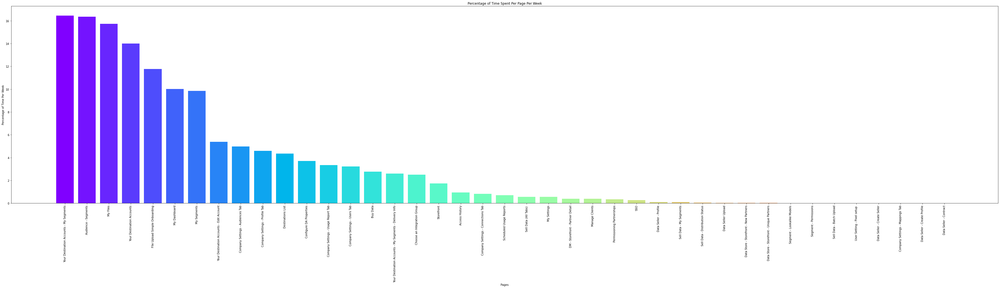

<Figure size 432x288 with 0 Axes>

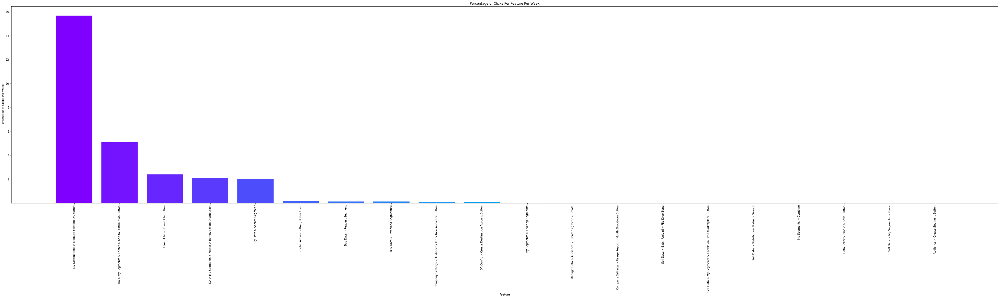

Top Pages on Left, Top Features on Right



,page
name,
Your Destination Accounts - My Segments,16.458640
Audience - Segments,16.344470
My Files,15.735679
Your Destination Accounts,14.000266
FIle Upload Simple Onboarding,11.773811
My Dashboard,10.007548
My Segments,9.836950
Your Destination Accounts - Edit Account,5.395159
Company Settings - Audiences Tab,4.980794


,visitor_id,_tkt5orHUpCVLIts2gorwT3UgG5I,_Ras6hyvLrUgJiRUgon4y1F4QkN4,_zdpPTMNp1EkXtBZR5v_ObuE7hwA,_C3ryON9ItgJ6UgOwQAZmIE8xa3A,_k39G0EasOmyrjXL_x4x8opM1toI,_m3O0KeqVvHCNvjUgwnA1gphjwBM,_3w9IhLaFCwHOywyY2kj6p7kk21Y,_H_1_rGmIvRDj8hnvXi1xwADN5Z4,_V1XJLd_R1gdR0eiF5Y7bThnGjHw,_GID55RO4sNhBCURo7Z1_lY9NLXs,_HbEegssf9k60Mv8lnrdv_889PHc,_IvuCbXKxt9FCXyAxrnqwFhXPFUM,_E_eF9X73IX3ARmERAfLkPPcHMb4,_56iulnmaAqdLQOD_wy_EtdOMLxw,_UHNiLRNy5_VWEPHlDcq1hAr1DTU,_HBzif5IJ9m2SMxfU1JYbpz5hruo,_VwQHIEgwiQ88mTKFEiIfk4a8aCk,_dGro_W0obaKWZs8l_xObcxKmhRg,_GHdt7hBJpluSyeNAQhuekke04S8,_9e_eJvJ3wbmYQlxEI7eadlGc0wA,_CUEn5DTA7EtIh2GfrV6n85e_ugg,_zyt_c4I5PLjo6We_foZiyC0uU8M,_iPN_NrvMGz0wIPCMZV9Vm2CcPyU,_uDfqoLTn6mYspzPtPbKZA4wRtTk,_LQERdzPDKTwyLqEqUOhRLxc2n_Q,_3JO1sgDixw7nC385pm1yyWWHhWw,_vkn0gs9bYzBqFjiHc9wDy5FJbE4,_myTn0VuzM9FtUyijGCGP6Z_vTiI,_hJN6mN74LKulBV6kg7OYGBM5J90,_visitor_id_1,_ASXExEiWYG_cuQMx9_2EiWlxyHE,_oWrmSRLq9EGkbAIMW5m9fefHm3I,_qlIwn8pRkAqQZ4CsWb5CrMTaGwk,_S9AHlZiStX_7kgOPa7XaN5zGKJ0,_BdAAb_f73rZbdntJycUeU30SMSE,_4WVDEkopjfr10pOms_IqOLI8q3A,_JBWNEhtQyWe7tTpphDB1E2_c_Ws,_CqeUW57vNe2GySW9cDdLyLUpufs,_ytijVcqrS7AhGhcFKcJqKtSwju0,...,_Rm7rAxrQI9_98GO7_ygsLiilAJQ,_NVkA8wwWIazlIpp0F4DCCyiG3o8,_P6NCbsdKIKmvIYKMm8uUrW9SOl4,_mxGqjxm536U_BXVu7z8q7zZmbqo,_AhOJz1Ioox06Vkwxv6djw6_1VeI,_QDZaqlR8uko08w45_tKNqFu6SCk,_Ew_SJ8Wdw46lSpx0KWtxA7TNLM4,_LQX8RAc0MobnZb2t_1_UPVKu7LE,_WaknTlZz_pfBrmqFQzzEj1jsIk0,_S9pjvffLNrxBdaR9LqaEZ5QZqOw,_Cx5SRBnNkb1UsbMhxArys4tZPdM,_7oK_B6o_L3kLLreWl1t_K0AyA1w,_t2Ln2u3D5kVaIxItCM9Cf0ahsbg,_kage2OvcmF6fsLCNJwKkDDHpsnw,__0Awg_cExCT_6iYo8MOZvfylGGY,_0bmHn6AFErG41_wmZ6k8PHJBdKE,_3pycSYabKnJw732sx4sue13_IUs,_FNfnbKKkdLypTj8AP_qO86xIyhI,_LE2l5nnwek4rOgiZbFqTuHIdpvc,_Lsz9qFm7N9IY7Jd7Q77PnG4SyP8,_PhDu_gcsFm1BJg7_TZjydBZLUg0,_cyrdB7bfmdofyOVdt1u2z2WfMTc,_e_WTUyY46NogQtZveUrs6E3aNNY,_i0n2sJzuvVQytRBZR0C7lOB8K5s,_jIMa2fYSvuK2S9oOiQA05CMk4BQ,_ocfanzV2X0KG7Z_36cENurW2s4g,_s0BAo4LpGWBZeXuZzBs0iwc9Y3g,_sTKQdz6y7r2BhOm_WA6swZd3DUI,_svSytwZWtEI_EYV7BjI3r7eloLg,_wUizPGfyYcYK73uhW_kPHhaTnXc,_wvwXLR4cYeeVmlTH5NugShsoM2Q,_zNMpq_T5yFVq2JNUeIa0QCHb638,_Y6yU_xYuZvaTeF9rnn0ikSv2i1c,_I_HTE_jumV_8c21faHrx5Biu3V4,_kXjzSeFxT2V9jYVtu6EChsDKWVI,_HP7vebwJnmfbCAUtVJV_wBlWWVc,_lzteCypibweqR_7n4L2h9m9rMBs,_R__S1f92sIxfQT6CMWA558ABGG8,_GeYydM_yIjUfBXDqOvUIFi5b8V0,hdb_scan
0,2311521,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.10,3.950000,0.0,27.360000,0.0,0.0,0.0,0.0,0.000000,0.0,27.440000,0.0,0.0,0.0,0.0,0.0,0.0,2311521,0.0,0.000000,0.000000,0.0,0.0,0.900000,0.90,0.00,0.000000,...,3.7,0.00,0.0,0.000000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20.266667,3.300000,0.000000,3.550000,0.000000,0.000000,1.900000,2.800000,0.000000,6.100000,2.650000,16.083333,0.000000,0.0,0.000000,28.020000,4.200000,7.500000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
1,2103499,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20.00,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,2103499,0.0,49.063918,12.600000,0.0,0.0,12.409091,0.00,3.55,0.000000,...,0.0,0.00,0.0,8.175000,4.85,0.0,0.0,0.0,0.0,0.0,0.0,1.3,0.0,0.0,0.000000,0.000000,22.124528,0.000000,11.275000,23.344444,3.600000,3.700000,0.000000,0.000000,3.780000,3.500000,0.000000,0.0,0.000000,17.166667,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,2131589,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13.25,10.700000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,6.150000,0.0,0.0,0.0,0.0,0.0,0.0,2131589,0.0,0.000000,0.000000,0.0,0.0,1.600000,0.00,0.00,0.000000,...,0.0,0.00,0.0,0.000000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.000000,9.837500,11.711111,0.000000,5.700000,0.000000,5.550000,6.520000,22.200000,9.450000,12.366667,8.100000,0.000000,0.0,13.600000,23.733333,4.300000,8.275000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
3,2051329,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.46,0.000000,0.0,37.400000,0.0,0.0,0.0,0.0,0.000000,0.0,7.558824,0.0,0.0,0.0,0.0,0.0,0.0,2051329,0.0,2.250000,28.250000,0.0,0.0,2.200000,0.00,0.00,0.000000,...,0.0,0.00,0.0,0.000000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,17.770000,5.814286,9.034

In [ ]:
hdb_scan(X, X_normalized, "hdb_scan", 40, 0.0, 2, 15, 500)

In [ ]:
#Since the generalist persona has the broadest set of responsibilites and largest size
#Let's assess whether there is a subpersona that can be identified when looking at a smaller subset of data
generalist = (X["hdb_scan"] == 3)

In [ ]:
#Identify just the advtv features
no_dis_df = id_name_mapping[id_name_mapping["app"] == "connect"]

#Non distribution and advtv page names, page ids, feature names, and feature ids
page_names = no_dis_df[no_dis_df["type"] == "page"]["name"]
p_ids = no_dis_df[no_dis_df["type"] == "page"]["reformatted_id"]
feature_names = no_dis_df[no_dis_df["type"] == "feature"]["name"]
f_ids = no_dis_df[no_dis_df["type"] == "feature"]["reformatted_id"]

In [ ]:
#Identify the advanced tv users who are too small to warrant their on cluster in the above clustering iteration
#But are known to be distinct due to qualitative data and user interviews
%%bigquery --project uxr-design-us-dev advtv_users
SELECT distinct visitor_id FROM `mixed_methods_clustering.all_features_telemetry_data_per_week_deduped`
WHERE app = "advanced_tv"

UNION ALL 

SELECT distinct visitor_id FROM `mixed_methods_clustering.all_pages_telemetry_data_per_week_deduped`
WHERE app = "advanced_tv"

In [ ]:
#Remove the advanced TV users from the dataset and the distribution features; 
#Look only at the generalist users and remove features that might be overpowering other signals in the data
tv_users = advtv_users["visitor_id"].to_list() #TV users
filtered_ids = np.append(p_ids, f_ids) #Non distribution (our core workflow) features

#Select just the generalist persona, removing those that we identify as tv users, with only the more focused features
Y = X[~(X["visitor_id"].isin(tv_users)) & generalist][ids].copy()

In [ ]:
# Scaling the data to bring all the attributes to a comparable level
scaler = StandardScaler()
Y_scaled = scaler.fit_transform(Y[ids])

# Normalizing the data so that the data
# approximately follows a Gaussian distribution
Y_normalized = normalize(Y_scaled)

# Converting the numpy array into a pandas DataFrame
Y_normalized = pd.DataFrame(Y_normalized)

# Renaming the columns
Y_normalized.columns = Y[ids].columns

Percent Clustered: 52


PERSONA CLUSTER: 0 

NUMBER OF USERS IN CLUSTER: 1075.0 

PERCENTAGE OF USERS IN CLUSTER: 35.584 



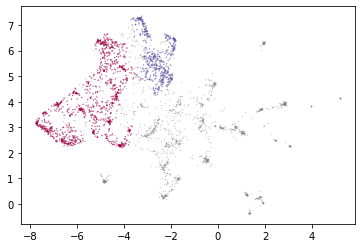

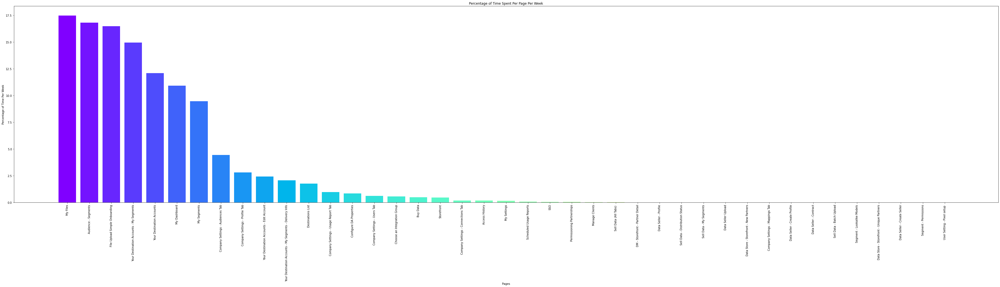

<Figure size 432x288 with 0 Axes>

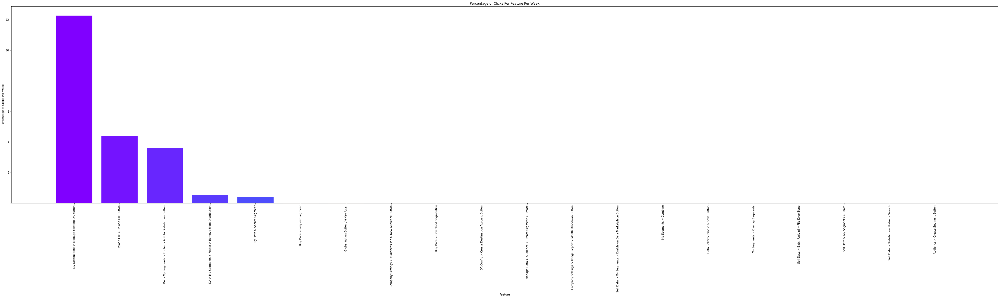

Top Pages on Left, Top Features on Right



,page
name,
My Files,17.491468
Audience - Segments,16.829118
FIle Upload Simple Onboarding,16.493959
Your Destination Accounts - My Segments,14.956707
Your Destination Accounts,12.094123
My Dashboard,10.924762
My Segments,9.467416
Company Settings - Audiences Tab,4.435966
Company Settings - Profile Tab,2.820731




PERSONA CLUSTER: 1 

NUMBER OF USERS IN CLUSTER: 522.0 

PERCENTAGE OF USERS IN CLUSTER: 17.279 



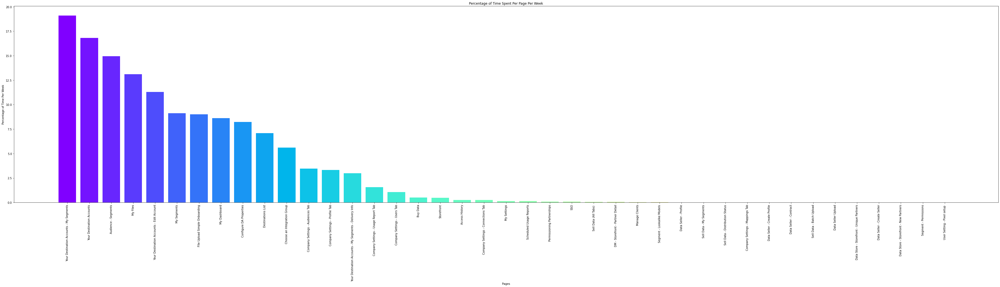

<Figure size 432x288 with 0 Axes>

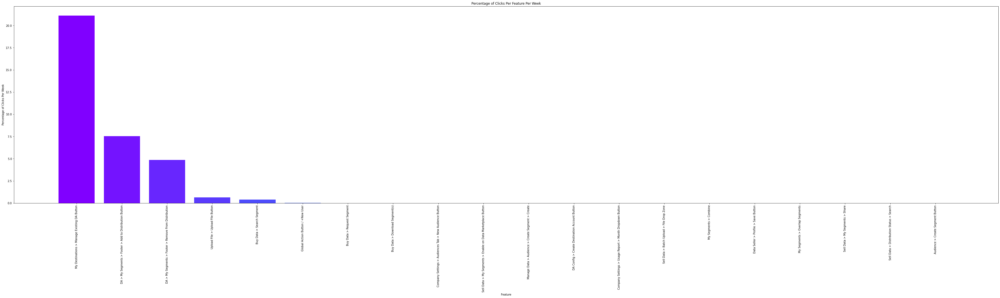

Top Pages on Left, Top Features on Right



,page
name,
Your Destination Accounts - My Segments,19.111273
Your Destination Accounts,16.810905
Audience - Segments,14.959235
My Files,13.106198
Your Destination Accounts - Edit Account,11.296776
My Segments,9.128990
FIle Upload Simple Onboarding,9.023625
My Dashboard,8.623950
Configure DA Properties,8.243503


,_tkt5orHUpCVLIts2gorwT3UgG5I,_Ras6hyvLrUgJiRUgon4y1F4QkN4,_zdpPTMNp1EkXtBZR5v_ObuE7hwA,_C3ryON9ItgJ6UgOwQAZmIE8xa3A,_k39G0EasOmyrjXL_x4x8opM1toI,_m3O0KeqVvHCNvjUgwnA1gphjwBM,_3w9IhLaFCwHOywyY2kj6p7kk21Y,_H_1_rGmIvRDj8hnvXi1xwADN5Z4,_V1XJLd_R1gdR0eiF5Y7bThnGjHw,_GID55RO4sNhBCURo7Z1_lY9NLXs,_HbEegssf9k60Mv8lnrdv_889PHc,_IvuCbXKxt9FCXyAxrnqwFhXPFUM,_E_eF9X73IX3ARmERAfLkPPcHMb4,_56iulnmaAqdLQOD_wy_EtdOMLxw,_UHNiLRNy5_VWEPHlDcq1hAr1DTU,_HBzif5IJ9m2SMxfU1JYbpz5hruo,_VwQHIEgwiQ88mTKFEiIfk4a8aCk,_dGro_W0obaKWZs8l_xObcxKmhRg,_GHdt7hBJpluSyeNAQhuekke04S8,_9e_eJvJ3wbmYQlxEI7eadlGc0wA,_CUEn5DTA7EtIh2GfrV6n85e_ugg,_zyt_c4I5PLjo6We_foZiyC0uU8M,_iPN_NrvMGz0wIPCMZV9Vm2CcPyU,_uDfqoLTn6mYspzPtPbKZA4wRtTk,_LQERdzPDKTwyLqEqUOhRLxc2n_Q,_3JO1sgDixw7nC385pm1yyWWHhWw,_vkn0gs9bYzBqFjiHc9wDy5FJbE4,_myTn0VuzM9FtUyijGCGP6Z_vTiI,_hJN6mN74LKulBV6kg7OYGBM5J90,_ASXExEiWYG_cuQMx9_2EiWlxyHE,_oWrmSRLq9EGkbAIMW5m9fefHm3I,_qlIwn8pRkAqQZ4CsWb5CrMTaGwk,_S9AHlZiStX_7kgOPa7XaN5zGKJ0,_BdAAb_f73rZbdntJycUeU30SMSE,_4WVDEkopjfr10pOms_IqOLI8q3A,_JBWNEhtQyWe7tTpphDB1E2_c_Ws,_CqeUW57vNe2GySW9cDdLyLUpufs,_ytijVcqrS7AhGhcFKcJqKtSwju0,_U8uusnL75FDx5Qy9gEV4YYpSJls,_wnkmLUff1uBbQNXIfS7V1fzkcGs,...,_Rm7rAxrQI9_98GO7_ygsLiilAJQ,_NVkA8wwWIazlIpp0F4DCCyiG3o8,_P6NCbsdKIKmvIYKMm8uUrW9SOl4,_mxGqjxm536U_BXVu7z8q7zZmbqo,_AhOJz1Ioox06Vkwxv6djw6_1VeI,_QDZaqlR8uko08w45_tKNqFu6SCk,_Ew_SJ8Wdw46lSpx0KWtxA7TNLM4,_LQX8RAc0MobnZb2t_1_UPVKu7LE,_WaknTlZz_pfBrmqFQzzEj1jsIk0,_S9pjvffLNrxBdaR9LqaEZ5QZqOw,_Cx5SRBnNkb1UsbMhxArys4tZPdM,_7oK_B6o_L3kLLreWl1t_K0AyA1w,_t2Ln2u3D5kVaIxItCM9Cf0ahsbg,_kage2OvcmF6fsLCNJwKkDDHpsnw,__0Awg_cExCT_6iYo8MOZvfylGGY,_0bmHn6AFErG41_wmZ6k8PHJBdKE,_3pycSYabKnJw732sx4sue13_IUs,_FNfnbKKkdLypTj8AP_qO86xIyhI,_LE2l5nnwek4rOgiZbFqTuHIdpvc,_Lsz9qFm7N9IY7Jd7Q77PnG4SyP8,_PhDu_gcsFm1BJg7_TZjydBZLUg0,_cyrdB7bfmdofyOVdt1u2z2WfMTc,_e_WTUyY46NogQtZveUrs6E3aNNY,_i0n2sJzuvVQytRBZR0C7lOB8K5s,_jIMa2fYSvuK2S9oOiQA05CMk4BQ,_ocfanzV2X0KG7Z_36cENurW2s4g,_s0BAo4LpGWBZeXuZzBs0iwc9Y3g,_sTKQdz6y7r2BhOm_WA6swZd3DUI,_svSytwZWtEI_EYV7BjI3r7eloLg,_wUizPGfyYcYK73uhW_kPHhaTnXc,_wvwXLR4cYeeVmlTH5NugShsoM2Q,_zNMpq_T5yFVq2JNUeIa0QCHb638,_Y6yU_xYuZvaTeF9rnn0ikSv2i1c,_I_HTE_jumV_8c21faHrx5Biu3V4,_kXjzSeFxT2V9jYVtu6EChsDKWVI,_HP7vebwJnmfbCAUtVJV_wBlWWVc,_lzteCypibweqR_7n4L2h9m9rMBs,_R__S1f92sIxfQT6CMWA558ABGG8,_GeYydM_yIjUfBXDqOvUIFi5b8V0,hdb_generalist
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.100000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,24.444444,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.700000,0.00,0.0,18.7375,0.000000,0.000000,...,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,27.016667,0.000000,23.450000,25.700000,13.000000,0.0,9.666667,0.000000,15.475000,0.000000,18.227273,16.955556,26.367500,0.0,0.000000,21.700000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1
15,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.800000,0.00,0.0,2.4,0.0,0.0,0.0,0.0,0.000000,0.0,10.081667,0.0,7.975,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.800000,0.00,0.0,0.0000,2.750000,3.400000,...,0.0,4.20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.689831,6.942857,16.139175,6.888889,4.300000,0.0,9.988889,5.122222,31.016667,6.628571,17.930435,13.455422,33.038854,0.0,8.800000,10.800000,10.000000,10.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1
31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.900000,1.94,0.0,6.5,0.0,0.0,0.0,0.0,0.000000,0.0,10.950000,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.00,0.0,1.2000,0.000000,0.000000,...,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,47.071429,0.000000,0.000000,0.000000,1.933333,0.0,0.000000,0.000000,0.400000,0.000000,2.400000,23.333333,2.600000,0.0,0.000000,10.928571,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1
39,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.350000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,8.294366,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.975000,4.30,3.2,5.9000,19.085714,8.566667,...,0.0,13.15,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.262500,6.248649,21.128205,5.411429,5.020000,0.0,7.715000,5.246667,1

In [ ]:
hdb_scan(Y, Y_normalized, "hdb_generalist", 40, 0.0, 2, 15, 500)

#Our Final Personas

In [ ]:
%%bigquery --project uxr-design-us-dev personas_df
SELECT * FROM mixed_methods_clustering.final_six_personas_hdb_scan_umap

In [ ]:
summary = personas_df[personas_df.columns.tolist()[2::]].groupby(["persona_label"]).mean()
summary['count'] = personas_df["persona_label"].value_counts()
summary = summary.sort_values(by='count', ascending=False)
summary

,_tkt5orHUpCVLIts2gorwT3UgG5I,_Ras6hyvLrUgJiRUgon4y1F4QkN4,_zdpPTMNp1EkXtBZR5v_ObuE7hwA,_C3ryON9ItgJ6UgOwQAZmIE8xa3A,_k39G0EasOmyrjXL_x4x8opM1toI,_m3O0KeqVvHCNvjUgwnA1gphjwBM,_3w9IhLaFCwHOywyY2kj6p7kk21Y,_H_1_rGmIvRDj8hnvXi1xwADN5Z4,_V1XJLd_R1gdR0eiF5Y7bThnGjHw,_GID55RO4sNhBCURo7Z1_lY9NLXs,_HbEegssf9k60Mv8lnrdv_889PHc,_IvuCbXKxt9FCXyAxrnqwFhXPFUM,_E_eF9X73IX3ARmERAfLkPPcHMb4,_56iulnmaAqdLQOD_wy_EtdOMLxw,_UHNiLRNy5_VWEPHlDcq1hAr1DTU,_HBzif5IJ9m2SMxfU1JYbpz5hruo,_VwQHIEgwiQ88mTKFEiIfk4a8aCk,_dGro_W0obaKWZs8l_xObcxKmhRg,_GHdt7hBJpluSyeNAQhuekke04S8,_9e_eJvJ3wbmYQlxEI7eadlGc0wA,_CUEn5DTA7EtIh2GfrV6n85e_ugg,_zyt_c4I5PLjo6We_foZiyC0uU8M,_iPN_NrvMGz0wIPCMZV9Vm2CcPyU,_uDfqoLTn6mYspzPtPbKZA4wRtTk,_LQERdzPDKTwyLqEqUOhRLxc2n_Q,_3JO1sgDixw7nC385pm1yyWWHhWw,_vkn0gs9bYzBqFjiHc9wDy5FJbE4,_myTn0VuzM9FtUyijGCGP6Z_vTiI,_hJN6mN74LKulBV6kg7OYGBM5J90,_ASXExEiWYG_cuQMx9_2EiWlxyHE,_oWrmSRLq9EGkbAIMW5m9fefHm3I,_qlIwn8pRkAqQZ4CsWb5CrMTaGwk,_S9AHlZiStX_7kgOPa7XaN5zGKJ0,_BdAAb_f73rZbdntJycUeU30SMSE,_4WVDEkopjfr10pOms_IqOLI8q3A,_JBWNEhtQyWe7tTpphDB1E2_c_Ws,_CqeUW57vNe2GySW9cDdLyLUpufs,_ytijVcqrS7AhGhcFKcJqKtSwju0,_U8uusnL75FDx5Qy9gEV4YYpSJls,_wnkmLUff1uBbQNXIfS7V1fzkcGs,...,_P6NCbsdKIKmvIYKMm8uUrW9SOl4,_mxGqjxm536U_BXVu7z8q7zZmbqo,_AhOJz1Ioox06Vkwxv6djw6_1VeI,_QDZaqlR8uko08w45_tKNqFu6SCk,_Ew_SJ8Wdw46lSpx0KWtxA7TNLM4,_LQX8RAc0MobnZb2t_1_UPVKu7LE,_WaknTlZz_pfBrmqFQzzEj1jsIk0,_S9pjvffLNrxBdaR9LqaEZ5QZqOw,_Cx5SRBnNkb1UsbMhxArys4tZPdM,_7oK_B6o_L3kLLreWl1t_K0AyA1w,_t2Ln2u3D5kVaIxItCM9Cf0ahsbg,_kage2OvcmF6fsLCNJwKkDDHpsnw,__0Awg_cExCT_6iYo8MOZvfylGGY,_0bmHn6AFErG41_wmZ6k8PHJBdKE,_3pycSYabKnJw732sx4sue13_IUs,_FNfnbKKkdLypTj8AP_qO86xIyhI,_LE2l5nnwek4rOgiZbFqTuHIdpvc,_Lsz9qFm7N9IY7Jd7Q77PnG4SyP8,_PhDu_gcsFm1BJg7_TZjydBZLUg0,_cyrdB7bfmdofyOVdt1u2z2WfMTc,_e_WTUyY46NogQtZveUrs6E3aNNY,_i0n2sJzuvVQytRBZR0C7lOB8K5s,_jIMa2fYSvuK2S9oOiQA05CMk4BQ,_ocfanzV2X0KG7Z_36cENurW2s4g,_s0BAo4LpGWBZeXuZzBs0iwc9Y3g,_sTKQdz6y7r2BhOm_WA6swZd3DUI,_svSytwZWtEI_EYV7BjI3r7eloLg,_wUizPGfyYcYK73uhW_kPHhaTnXc,_wvwXLR4cYeeVmlTH5NugShsoM2Q,_zNMpq_T5yFVq2JNUeIa0QCHb638,_Y6yU_xYuZvaTeF9rnn0ikSv2i1c,_I_HTE_jumV_8c21faHrx5Biu3V4,_kXjzSeFxT2V9jYVtu6EChsDKWVI,_HP7vebwJnmfbCAUtVJV_wBlWWVc,_lzteCypibweqR_7n4L2h9m9rMBs,_R__S1f92sIxfQT6CMWA558ABGG8,_GeYydM_yIjUfBXDqOvUIFi5b8V0,hdb_scan,interviewed,count
persona_label,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
generalist,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.004363,0.000000,0.002772,0.219461,0.217806,0.000000,2.934638,0.001745,0.004466,0.290207,0.125642,5.917170,0.112996,17.553375,2.948211,1.307240,0.040264,0.000000,0.009112,0.0,0.022485,0.075065,0.143905,0.007187,0.581026,0.613349,0.519739,0.041440,2.899964,4.650914,1.355214,...,0.002310,0.146517,0.030270,0.000000,0.009600,0.775404,0.0000,0.006379,0.000000,0.000000,0.000257,0.000000,17.287479,5.782186,10.040876,7.031499,2.426874,0.859227,9.169007,5.554165,14.766750,5.281456,9.501386,15.052168,16.077017,0.377130,4.672792,4.014813,3.562155,5.274071,0.000000,0.000000,0.000000,0.000000,0.000103,0.000000,0.000000,3,0.002567,1948
data_buyer,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.001370,0.000000,0.002439,6.132920,4.459272,0.002033,25.021932,0.000587,0.006052,0.377558,0.066983,3.975427,0.125675,11.679858,0.736782,0.266181,0.001626,0.000294,0.005872,0.0,0.000000,0.060509,0.168799,0.000000,0.775522,7.344499,1.930698,0.175590,2.466569,2.265135,0.613917,...,0.000000,0.156271,0.173550,0.000000,0.002078,0.722441,0.0000,0.007769,0.000000,0.000632,0.002620,0.000000,15.024497,4.217480,9.219443,4.374037,10.752743,0.654737,4.832376,4.174845,6.690887,3.871097,7.173670,12.579695,8.635319,0.278693,2.942064,41.474597,2.622706,3.725441,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1,0.005420,1107
uploader,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.004372,0.007737,0.000000,0.403305,0.000000,0.000000,0.005395,0.005349,3.601576



PERSONA CLUSTER: generalist 

NUMBER OF USERS IN CLUSTER: 1948.0 

PERCENTAGE OF USERS IN CLUSTER: 33.551 



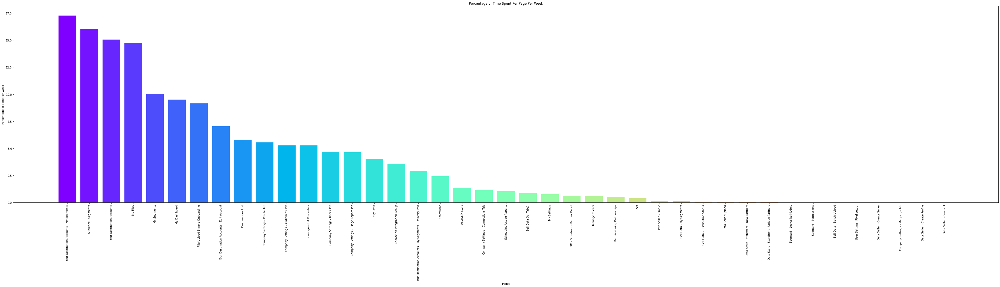

<Figure size 432x288 with 0 Axes>

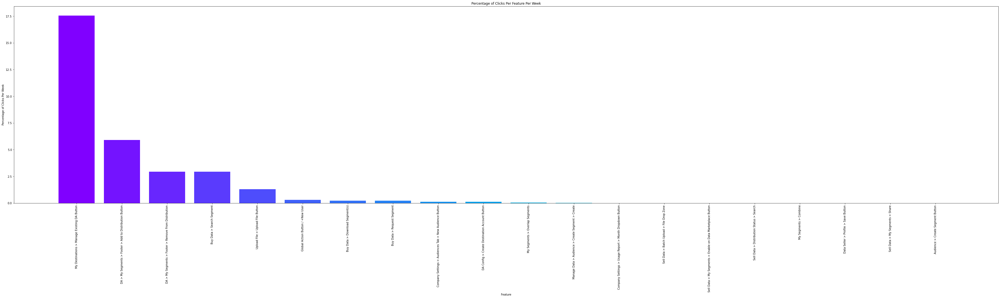

Top Pages on Left, Top Features on Right



,page
name,
Your Destination Accounts - My Segments,17.287479
Audience - Segments,16.077017
Your Destination Accounts,15.052168
My Files,14.766750
My Segments,10.040876
My Dashboard,9.501386
FIle Upload Simple Onboarding,9.169007
Your Destination Accounts - Edit Account,7.031499
Destinations List,5.782186




PERSONA CLUSTER: data_buyer 

NUMBER OF USERS IN CLUSTER: 1107.0 

PERCENTAGE OF USERS IN CLUSTER: 19.066 



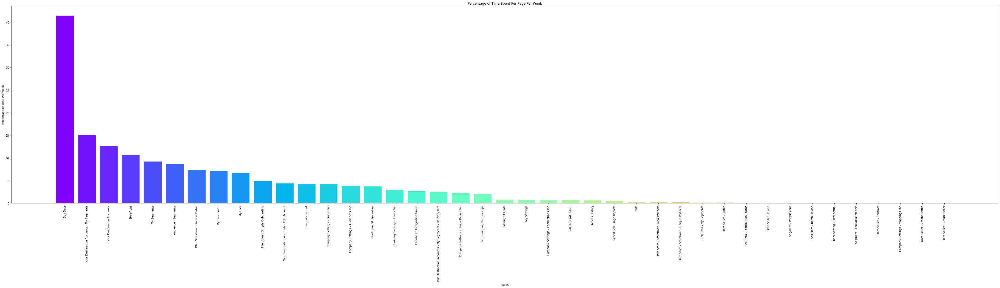

<Figure size 432x288 with 0 Axes>

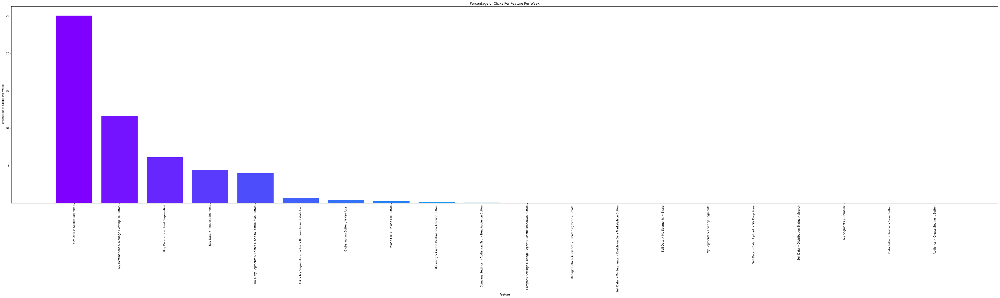

Top Pages on Left, Top Features on Right



,page
name,
Buy Data,41.474597
Your Destination Accounts - My Segments,15.024497
Your Destination Accounts,12.579695
Storefront,10.752743
My Segments,9.219443
Audience - Segments,8.635319
DM - Storefront - Partner Detail,7.344499
My Dashboard,7.173670
My Files,6.690887




PERSONA CLUSTER: uploader 

NUMBER OF USERS IN CLUSTER: 1075.0 

PERCENTAGE OF USERS IN CLUSTER: 18.515 



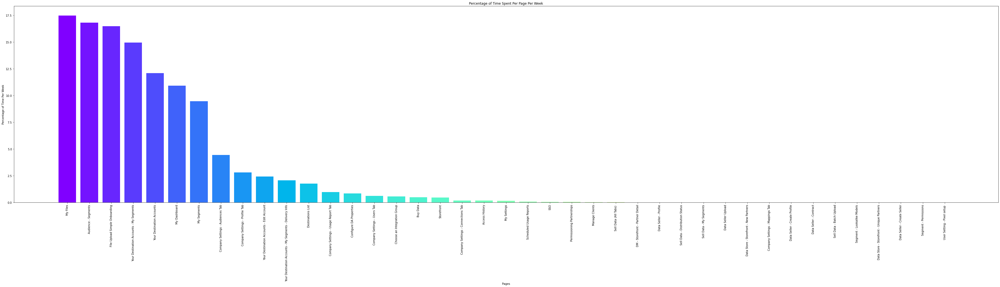

<Figure size 432x288 with 0 Axes>

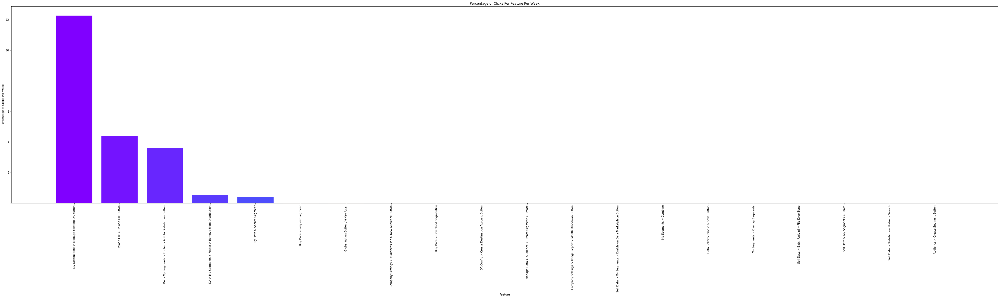

Top Pages on Left, Top Features on Right



,page
name,
My Files,17.491468
Audience - Segments,16.829118
FIle Upload Simple Onboarding,16.493959
Your Destination Accounts - My Segments,14.956707
Your Destination Accounts,12.094123
My Dashboard,10.924762
My Segments,9.467416
Company Settings - Audiences Tab,4.435966
Company Settings - Profile Tab,2.820731




PERSONA CLUSTER: data_seller 

NUMBER OF USERS IN CLUSTER: 836.0 

PERCENTAGE OF USERS IN CLUSTER: 14.399 



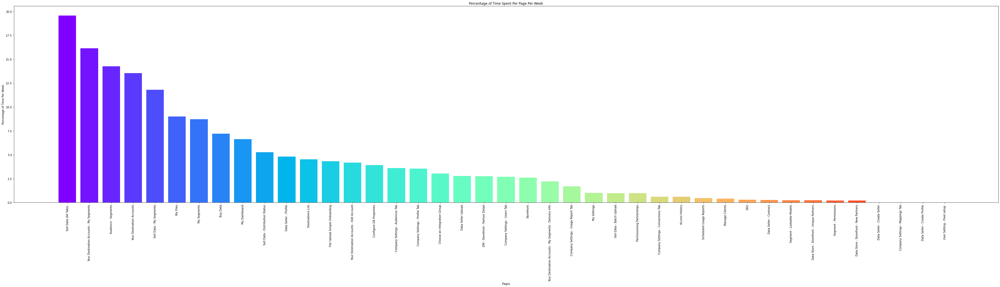

<Figure size 432x288 with 0 Axes>

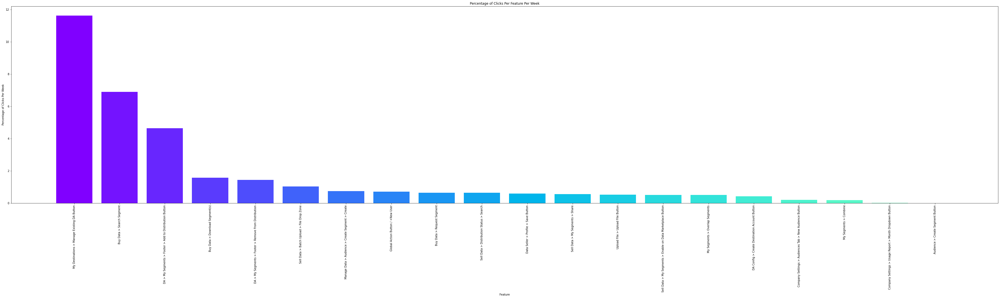

Top Pages on Left, Top Features on Right



,page
name,
Sell Data (All Tabs),19.581599
Your Destination Accounts - My Segments,16.130578
Audience - Segments,14.269533
Your Destination Accounts,13.545687
Sell Data - My Segments,11.797409
My Files,9.006896
My Segments,8.709249
Buy Data,7.203044
My Dashboard,6.629839




PERSONA CLUSTER: agency_user 

NUMBER OF USERS IN CLUSTER: 707.0 

PERCENTAGE OF USERS IN CLUSTER: 12.177 



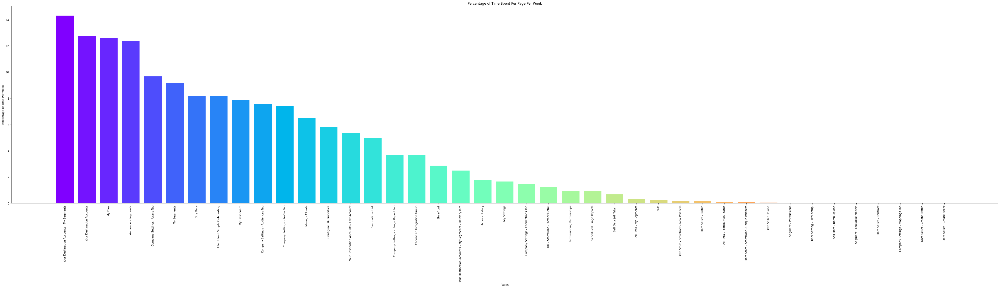

<Figure size 432x288 with 0 Axes>

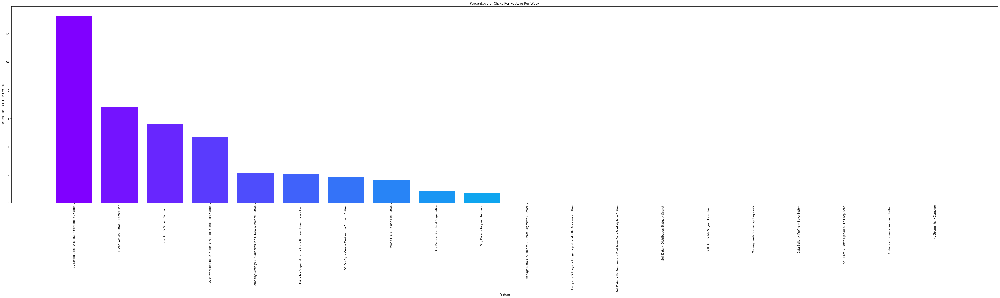

Top Pages on Left, Top Features on Right



,page
name,
Your Destination Accounts - My Segments,14.314030
Your Destination Accounts,12.744009
My Files,12.582974
Audience - Segments,12.351063
Company Settings - Users Tab,9.663632
My Segments,9.150992
Buy Data,8.189307
FIle Upload Simple Onboarding,8.169976
My Dashboard,7.879950




PERSONA CLUSTER: tv_user 

NUMBER OF USERS IN CLUSTER: 133.0 

PERCENTAGE OF USERS IN CLUSTER: 2.291 



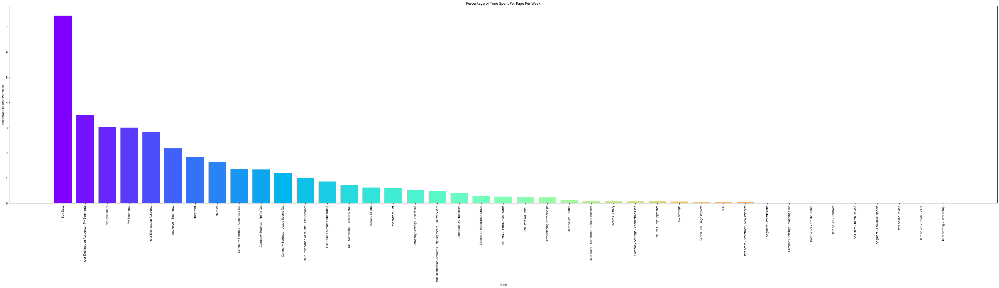

<Figure size 432x288 with 0 Axes>

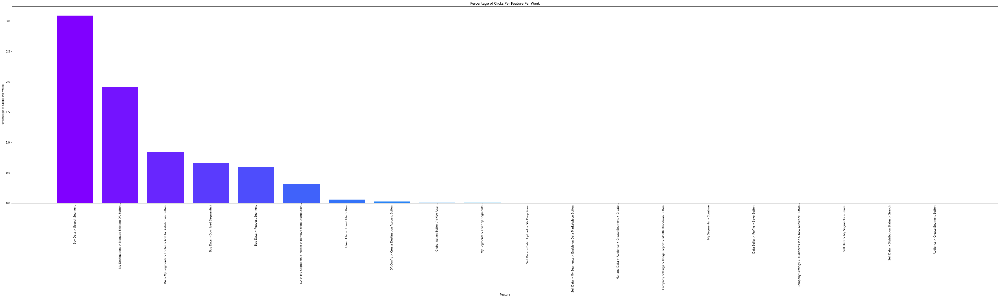

Top Pages on Left, Top Features on Right



,page
name,
Buy Data,7.455487
Your Destination Accounts - My Segments,3.493960
My Dashboard,3.012546
My Segments,3.006855
Your Destination Accounts,2.842607
Audience - Segments,2.178144
Storefront,1.836381
My Files,1.637336
Company Settings - Audiences Tab,1.378383


In [ ]:
cluster_means_and_plots_both(summary, 10, "generalist") 
cluster_means_and_plots_both(summary, 10, "data_buyer") 
cluster_means_and_plots_both(summary, 10, "uploader") 
cluster_means_and_plots_both(summary, 10, "data_seller") 
cluster_means_and_plots_both(summary, 10, "agency_user") 
cluster_means_and_plots_both(summary, 10, "tv_user") 

In [ ]:
summary['count']

persona_label
generalist     1948
data_buyer     1107
uploader       1075
data_seller     836
agency_user     707
tv_user         133
Name: count, dtype: int64